# 3-Beaty (3조) 제출용 코드 정리

### Import library

In [1]:
from util.repo_paths import AMAZON
# 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import datetime
from datetime import datetime, timedelta
import re
import string

# 텍스트 데이터를 위한 라이브러리
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import StandardScaler

# 언어 감지 및 번역을 위한 라이브러리: langdetect 간편하게 사용할 수 있어서 선택, 
# Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용
from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
from deep_translator import GoogleTranslator

# 바이그램 및 트리그램을 위한 라이브러리
from nltk.util import ngrams
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from collections import Counter

# 팔레트 색상 테스트를 위한 라이브러리
from matplotlib.colors import LinearSegmentedColormap
from itertools import cycle
import plotly.graph_objects as go
import plotly.io as pio


from wordcloud import WordCloud

# TF-IDF를 위한 라이브러리
from sklearn.feature_extraction.text import TfidfVectorizer

# 감성분석을 위한 라이브러리
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# LDA 및 토픽 모델링을 위한 라이브러리
import gensim
from gensim.utils import simple_preprocess
# import gensim.corpora as corpora
from gensim import corpora
from pprint import pprint
import pyLDAvis.gensim
import pickle
import pyLDAvis

# 틱톡커 추천을 위한 라이브러리
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


import warnings
warnings.filterwarnings('ignore')

CWD = os.getcwd()

DATA_PATH = str(AMAZON)
print("현재 경로: ", CWD)

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/colors.py:35: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/rcmod.py:31: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVers

현재 경로:  /Users/jun/GitStudy/Data_4/src/project/project5/final_analysis_code


# Tiktok Data

## PART 1: Data Preprocessing

In [2]:
# 틱톡커 추천을 위한 라이브러리
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

### Load Data

In [ ]:
# TikTok 키워드별 post 데이터 + 인플루언서 데이터 로드.
# load_keyword_dfs() 는 통합 csv를 search_term 값으로 split해 dict로 돌려준다
# (raw 4개 파일은 분실 — data_io.py 참조).
from util.repo_paths import TIKTOK
from util.data_io import load_keyword_dfs

_kw = load_keyword_dfs()
keyword_df, clean_beauty_df, glow_skin_df, kbeauty_skin_care_df, korean_skincare_df = (
    _kw["all"], _kw["clean_beauty"], _kw["glow_skin"], _kw["kbeauty_skin_care"], _kw["korean_skincare"]
)
# 인플루언서 누적 통계 (1월 27일자 dedup된 단일 csv)
tiktoker_df = pd.read_csv(TIKTOK / "tiktoker_final_df_0127.csv")


### Data Preprocessing

#### 1. 키워드df 합치기

##### 1-1 : 키워드 df별 중복행 제거

In [3]:
clean_beauty_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
glow_skin_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
kbeauty_skin_care_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
korean_skincare_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)

NameError: name 'clean_beauty_df' is not defined

##### 1-2 : 각 df별 키워드 컬럼 만들어주기
> - 어떤 검색어를 입력하여 추출한 영상인지 알기 위해 검색어 컬럼을 만들어줌

In [60]:
# clean_beauty_df
for i in range(len(clean_beauty_df)):
    clean_beauty_df.loc[i, 'search_term'] = 'clean_beauty'

# glow_skin_df
for i in range(len(glow_skin_df)):
    glow_skin_df.loc[i, 'search_term'] = 'glow skin'

# kbeauty_skin_care_df
for i in range(len(kbeauty_skin_care_df)):
    kbeauty_skin_care_df.loc[i, 'search_term'] = 'kbeauty skin care'

# korean_skincare_df
for i in range(len(korean_skincare_df)):
    korean_skincare_df.loc[i, 'search_term'] = 'korean skincare'

##### 1-3 : 각 df별 노출 순서 컬럼 만들어주기 
> - 각 검색어를 입력했을 때 영상들이 몇 번째에 떴는지에 대한 컬럼 만들어주기

In [61]:
# clean_beauty_df
for i in range(len(clean_beauty_df)):
    clean_beauty_df.loc[i, 'vedio_order'] = i + 1

# glow_skin_df
for i in range(len(glow_skin_df)):
    glow_skin_df.loc[i, 'vedio_order'] = i + 1

# kbeauty_skin_care_df
for i in range(len(kbeauty_skin_care_df)):
    kbeauty_skin_care_df.loc[i, 'vedio_order'] = i + 1

# korean_skincare_df
for i in range(len(korean_skincare_df)):
    korean_skincare_df.loc[i, 'vedio_order'] = i + 1

clean_beauty_df['vedio_order'] = clean_beauty_df['vedio_order'].astype(int)
glow_skin_df['vedio_order'] = glow_skin_df['vedio_order'].astype(int)
kbeauty_skin_care_df['vedio_order'] = kbeauty_skin_care_df['vedio_order'].astype(int)
korean_skincare_df['vedio_order'] = korean_skincare_df['vedio_order'].astype(int)

##### 1-5 : df 합치기

In [63]:
cb_gl_concat = pd.concat([clean_beauty_df,glow_skin_df], axis=0, ignore_index=True)
kbs_ks_concat = pd.concat([kbeauty_skin_care_df,korean_skincare_df], axis=0, ignore_index=True)
keyword_df = pd.concat([cb_gl_concat,kbs_ks_concat], axis=0, ignore_index=True)
keyword_df

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order
0,1563,73,894,morganlkeen,2024-9-5,Replying to @user8022071884889 Non-Toxic Makeu...,clean_beauty,1
1,1337,102,189,therealkatiestone,1-3,#greenscreen new year new diagram #cleansers #...,clean_beauty,2
2,8057,164,5654,kylies.muse,2024-2-1,Replying to @MTMama3 clean makeup options! Som...,clean_beauty,3
3,831,32,432,balancewithani,2024-7-2,I've been looking for a non-toxic beauty brand...,clean_beauty,4
4,5634,104,542,labmuffinbeautyscience,2024-6-22,Clean beauty isn’t making products safer - tha...,clean_beauty,5
...,...,...,...,...,...,...,...,...
778,21.8K,187,6709,4chriisty,2024-6-9,use my yesstyle rewards code CRISPY5 to save m...,korean skincare,193
779,216.3K,381,22.6K,moonskinclub,2023-2-26,✨✨douyin evening skincare routine ✨✨ D: 248154...,korean skincare,194
780,9841,59,2616,koocat,2024-11-18,(non sponsored) a very candid random vid but i...,korean skincare,195
781,881,8,73,ririsglow_,2024-8-26,I’m not leaving the house once my 12 step skin...,korean skincare,196


#### 2. 숫자형, 날짜형 컬럼 전처리
> - view, like, comment, save 컬럼 : 단위(k,m) 변환
> - date
    >> - 25년도 1월 업로드한 경우 2025-01-nn으로 변환 
    >> - nh ago, nd ago, 1w ago인 경우 2025-01-21기준으로 날짜 계산

##### 2-1. date 컬럼 형식 통일 및 datetime으로 변환

In [64]:
def preprocess_date(df):
    today = datetime(2025, 1, 21)

    for i in range(len(df)):
    
        if len(df['date'][i]) >= 8:
            df.loc[i, 'upload_date'] = df['date'][i]
    
        elif len(df['date'][i]) >= 6:
            date = df['date'][i].replace(' ','')
            alphabet_list = [a for a in date]
    
            if 'h' in alphabet_list:
                df.loc[i, 'upload_date'] = today
    
            elif 'd' in alphabet_list:
                day = alphabet_list[0]
                day = int(day)
                df.loc[i, 'upload_date'] = today - timedelta(days=day)
    
            elif 'w' in alphabet_list:
                week = alphabet_list[0]
                week = int(week)
                df.loc[i, 'upload_date'] = today - timedelta(weeks=week)
    
        elif len(df['date'][i]) == 4:
            df.loc[i, 'upload_date'] = '2025-' + df['date'][i]
    
        elif len(df['date'][i]) == 3:
            df.loc[i, 'upload_date'] = '2025-' + df['date'][i]

    # datetime형으로 변환
    df['upload_date'] = pd.to_datetime(df['upload_date'], format="%Y-%m-%d", errors='coerce')


preprocess_date(keyword_df)
preprocess_date(tiktoker_df)

In [65]:
# follower 컬럼 단위 전처리 / tiktoker_df만 진행

def process_follower(df):
    for i in range(len(df)):
        follower = df['follower'][i].replace(' ','')
        follower_list = [a for a in follower]
        if 'K' in follower_list:
            num = follower.split('K')[0]
            num = float(num)
            follower_cal = num*1000
            df.loc[i, 'follower_cnt'] = follower_cal
        elif 'M' in follower_list:
            num = follower.split('M')[0]
            num = float(num)
            follower_cal = num*1000000
            df.loc[i, 'follower_cnt'] = follower_cal
        else:
            num = df['follower'][i].replace(' ','')
            follower_cal = float(num)
            df.loc[i, 'follower_cnt'] = follower_cal

process_follower(tiktoker_df)

In [66]:
# keyword_df 결과 확인 1
keyword_df.tail()

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order,upload_date
778,21.8K,187,6709,4chriisty,2024-6-9,use my yesstyle rewards code CRISPY5 to save m...,korean skincare,193,2024-06-09
779,216.3K,381,22.6K,moonskinclub,2023-2-26,✨✨douyin evening skincare routine ✨✨ D: 248154...,korean skincare,194,2023-02-26
780,9841,59,2616,koocat,2024-11-18,(non sponsored) a very candid random vid but i...,korean skincare,195,2024-11-18
781,881,8,73,ririsglow_,2024-8-26,I’m not leaving the house once my 12 step skin...,korean skincare,196,2024-08-26
782,226.5K,1086,55.5K,amyflamy1,1-11,Cheap skincare routine pt.2 #ILLIYOONpartner #...,korean skincare,197,2025-01-11


In [67]:
# keyword_df 결과 확인 1
print(keyword_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783 entries, 0 to 782
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   like           783 non-null    object        
 1   comment        783 non-null    object        
 2   save           783 non-null    object        
 3   tiktoker_name  783 non-null    object        
 4   date           783 non-null    object        
 5   info           782 non-null    object        
 6   search_term    783 non-null    object        
 7   vedio_order    783 non-null    int32         
 8   upload_date    779 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int32(1), object(7)
memory usage: 52.1+ KB
None


In [68]:
# tiktoker_df 결과 확인 1
tiktoker_df.head(3)

,Unnamed: 0,name,follower,view,like,comment,save,date,info_tag,hash_tag,upload_date,follower_cnt
0,0,mydelicate,399.8K,5158,1334,74,175,14h ago,my favourite blushes and why (with shades)💓 yo...,"['@YesStyle', '@Flower Knows Makeup', '@House ...",2025-01-21,399800.00
1,1,mydelicate,399.8K,24.3K,6606,246,917,3d ago,spend a productive morning with me 💓🎀 why is i...,"['#koreanskincare', '#kbeauty', '#morningrouti...",2025-01-18,399800.00
2,2,mydelicate,399.8K,10.4K,1881,90,218,6d ago,for my girlies who still want to look cute whe...,"['@SHEINUS', '@SHEIN', '#fashion', '#winterclo...",2025-01-15,399800.00


In [69]:
# tiktoker_df 결과 확인 2
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    1680 non-null   int64         
 1   name          1680 non-null   object        
 2   follower      1680 non-null   object        
 3   view          1680 non-null   object        
 4   like          1680 non-null   object        
 5   comment       1680 non-null   int64         
 6   save          1680 non-null   object        
 7   date          1680 non-null   object        
 8   info_tag      1664 non-null   object        
 9   hash_tag      1680 non-null   object        
 10  upload_date   1680 non-null   datetime64[us]
 11  follower_cnt  1680 non-null   float64       
dtypes: datetime64[us](1), float64(1), int64(2), object(8)
memory usage: 157.6+ KB


##### 2-2. view, like, comment, save컬럼 단위 변환

In [70]:
# view 컬럼 단위 전처리

def process_view(df):
    for i in range(len(df)):
        view = df['view'][i].replace(' ','')
        view_list = [a for a in view]
        if 'K' in view_list:
            num = view.split('K')[0]
            num = float(num)
            view_cal = num*1000
            df.loc[i, 'view_cnt'] = view_cal
        elif 'M' in view_list:
            num = view.split('M')[0]
            num = float(num)
            view_cal = num*1000000
            df.loc[i, 'view_cnt'] = view_cal
        else:
            num = df['view'][i].replace(' ','')
            view_cal = float(num)
            df.loc[i, 'view_cnt'] = view_cal

process_view(tiktoker_df)

In [71]:
# like 컬럼 단위 전처리

def process_like(df):
    for i in range(len(df)):
        like = df['like'][i].replace(' ','')
        like_list = [a for a in like]
        if 'K' in like_list:
            num = like.split('K')[0]
            num = float(num)
            like_cal = num*1000
            df.loc[i, 'like_cnt'] = like_cal
        elif 'M' in like_list:
            num = like.split('M')[0]
            num = float(num)
            like_cal = num*1000000
            df.loc[i, 'like_cnt'] = like_cal
        else:
            num = df['like'][i].replace(' ','')
            like_cal = float(num)
            df.loc[i, 'like_cnt'] = like_cal

process_like(keyword_df)
process_like(tiktoker_df)

In [72]:
# comment 컬럼 단위 전처리

def process_comment(df):
    for i in range(len(df)):
        comment = str(df['comment'][i]).replace(' ','')
        comment_list = [a for a in comment]
        if 'K' in comment_list:
            num = comment.split('K')[0]
            num = float(num)
            comment_cal = num*1000
            df.loc[i, 'comment_cnt'] = comment_cal
        elif 'M' in comment_list:
            num = comment.split('M')[0]
            num = float(num)
            comment_cal = num*1000000
            df.loc[i, 'comment_cnt'] = comment_cal
        else:
            num = str(df['comment'][i]).replace(' ','')
            comment_cal = float(num)
            df.loc[i, 'comment_cnt'] = comment_cal

process_comment(keyword_df)
process_comment(tiktoker_df)

In [73]:
# save 컬럼 단위 전처리

def process_save(df):
    for i in range(len(df)):
        save = df['save'][i].replace(' ','')
        save_list = [a for a in save]
        if 'K' in save_list:
            num = save.split('K')[0]
            num = float(num)
            save_cal = num*1000
            df.loc[i, 'save_cnt'] = save_cal
        elif 'M' in save_list:
            num = save.split('M')[0]
            num = float(num)
            save_cal = num*1000000
            df.loc[i, 'save_cnt'] = save_cal
        else:
            num = df['save'][i].replace(' ','')
            save_cal = float(num)
            df.loc[i, 'save_cnt'] = save_cal

process_save(keyword_df)
process_save(tiktoker_df)

In [74]:
# like_cnt, comment_cnt, save_cnt컬럼 float에서 int로 변환
keyword_df['like_cnt'] = keyword_df['like_cnt'].round(0).astype(int)
keyword_df['comment_cnt'] = keyword_df['comment_cnt'].round(0).astype(int)
keyword_df['save_cnt'] = keyword_df['save_cnt'].round(0).astype(int)

tiktoker_df['view_cnt'] = tiktoker_df['view_cnt'].round(0).astype(int)
tiktoker_df['like_cnt'] = tiktoker_df['like_cnt'].round(0).astype(int)
tiktoker_df['comment_cnt'] = tiktoker_df['comment_cnt'].round(0).astype(int)
tiktoker_df['save_cnt'] = tiktoker_df['save_cnt'].round(0).astype(int)

In [75]:
# keyword_df 결과 확인 1
keyword_df.head(5)

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order,upload_date,like_cnt,comment_cnt,save_cnt
0,1563,73,894,morganlkeen,2024-9-5,Replying to @user8022071884889 Non-Toxic Makeu...,clean_beauty,1,2024-09-05,1563,73,894
1,1337,102,189,therealkatiestone,1-3,#greenscreen new year new diagram #cleansers #...,clean_beauty,2,2025-01-03,1337,102,189
2,8057,164,5654,kylies.muse,2024-2-1,Replying to @MTMama3 clean makeup options! Som...,clean_beauty,3,2024-02-01,8057,164,5654
3,831,32,432,balancewithani,2024-7-2,I've been looking for a non-toxic beauty brand...,clean_beauty,4,2024-07-02,831,32,432
4,5634,104,542,labmuffinbeautyscience,2024-6-22,Clean beauty isn’t making products safer - tha...,clean_beauty,5,2024-06-22,5634,104,542


In [76]:
# keyword_df 결과 확인 2
keyword_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783 entries, 0 to 782
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   like           783 non-null    object        
 1   comment        783 non-null    object        
 2   save           783 non-null    object        
 3   tiktoker_name  783 non-null    object        
 4   date           783 non-null    object        
 5   info           782 non-null    object        
 6   search_term    783 non-null    object        
 7   vedio_order    783 non-null    int32         
 8   upload_date    779 non-null    datetime64[ns]
 9   like_cnt       783 non-null    int32         
 10  comment_cnt    783 non-null    int32         
 11  save_cnt       783 non-null    int32         
dtypes: datetime64[ns](1), int32(4), object(7)
memory usage: 61.3+ KB


In [77]:
# tiktoker_df 결과 확인 1
tiktoker_df.head(3)

,Unnamed: 0,name,follower,view,like,comment,save,date,info_tag,hash_tag,upload_date,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt
0,0,mydelicate,399.8K,5158,1334,74,175,14h ago,my favourite blushes and why (with shades)💓 yo...,"['@YesStyle', '@Flower Knows Makeup', '@House ...",2025-01-21,399800.00,5158,1334,74,175
1,1,mydelicate,399.8K,24.3K,6606,246,917,3d ago,spend a productive morning with me 💓🎀 why is i...,"['#koreanskincare', '#kbeauty', '#morningrouti...",2025-01-18,399800.00,24300,6606,246,917
2,2,mydelicate,399.8K,10.4K,1881,90,218,6d ago,for my girlies who still want to look cute whe...,"['@SHEINUS', '@SHEIN', '#fashion', '#winterclo...",2025-01-15,399800.00,10400,1881,90,218


In [78]:
# tiktoker_df 결과 확인2
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    1680 non-null   int64         
 1   name          1680 non-null   object        
 2   follower      1680 non-null   object        
 3   view          1680 non-null   object        
 4   like          1680 non-null   object        
 5   comment       1680 non-null   int64         
 6   save          1680 non-null   object        
 7   date          1680 non-null   object        
 8   info_tag      1664 non-null   object        
 9   hash_tag      1680 non-null   object        
 10  upload_date   1680 non-null   datetime64[us]
 11  follower_cnt  1680 non-null   float64       
 12  view_cnt      1680 non-null   int32         
 13  like_cnt      1680 non-null   int32         
 14  comment_cnt   1680 non-null   int32         
 15  save_cnt      1680 non-null   int32   

#### 3. 해시태그 컬럼 생성
> - 크롤링 한 데이터를 csv파일로 변환하는 과정에서 hash_tag컬럼의 일부 행들이 손상되는 문제 발생
> - info 컬럼에서 해시태그 추출하여 해시태그 컬럼 다시 생성

##### 3-1. info 컬럼에서 해시태그 추출

In [79]:
tiktoker_df = tiktoker_df.rename(columns={'info_tag': 'info'})

def new_hash_tag_process(df):
    for i in range(len(df)):
        info = str(df['info'][i])
        info_split_list = info.split(' ')
        hash_tag_list = []
        for a in info_split_list:
            if a.startswith('#'):
                hash_tag_list.append(a)
            elif a.startswith('@'):
                hash_tag_list.append(a)
            else:
                pass
        df.loc[i, 'hash_tag'] = ','.join(hash_tag_list)

new_hash_tag_process(keyword_df)
new_hash_tag_process(tiktoker_df)

In [80]:
# keyword_df 결과 확인 1
keyword_df.head(3)

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order,upload_date,like_cnt,comment_cnt,save_cnt,hash_tag
0,1563,73,894,morganlkeen,2024-9-5,Replying to @user8022071884889 Non-Toxic Makeu...,clean_beauty,1,2024-09-05,1563,73,894,@user8022071884889
1,1337,102,189,therealkatiestone,1-3,#greenscreen new year new diagram #cleansers #...,clean_beauty,2,2025-01-03,1337,102,189,"#greenscreen,#cleansers,#skincare,#beauty,#bea..."
2,8057,164,5654,kylies.muse,2024-2-1,Replying to @MTMama3 clean makeup options! Som...,clean_beauty,3,2024-02-01,8057,164,5654,@MTMama3


In [81]:
# keyword_df 결과 확인 2
keyword_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783 entries, 0 to 782
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   like           783 non-null    object        
 1   comment        783 non-null    object        
 2   save           783 non-null    object        
 3   tiktoker_name  783 non-null    object        
 4   date           783 non-null    object        
 5   info           782 non-null    object        
 6   search_term    783 non-null    object        
 7   vedio_order    783 non-null    int32         
 8   upload_date    779 non-null    datetime64[ns]
 9   like_cnt       783 non-null    int32         
 10  comment_cnt    783 non-null    int32         
 11  save_cnt       783 non-null    int32         
 12  hash_tag       783 non-null    object        
dtypes: datetime64[ns](1), int32(4), object(8)
memory usage: 67.4+ KB


In [82]:
# tiktoker_df 결과 확인 1
tiktoker_df.head(3)

,Unnamed: 0,name,follower,view,like,comment,save,date,info,hash_tag,upload_date,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt
0,0,mydelicate,399.8K,5158,1334,74,175,14h ago,my favourite blushes and why (with shades)💓 yo...,"@YesStyle,@House,#cbeauty,#koreanmakeup,#skinc...",2025-01-21,399800.00,5158,1334,74,175
1,1,mydelicate,399.8K,24.3K,6606,246,917,3d ago,spend a productive morning with me 💓🎀 why is i...,"#kbeauty,#morningroutine,#vlog,#wonyoungism,#s...",2025-01-18,399800.00,24300,6606,246,917
2,2,mydelicate,399.8K,10.4K,1881,90,218,6d ago,for my girlies who still want to look cute whe...,"@SHEINUS,@SHEIN\nuse,#winterclothes,#coquette,...",2025-01-15,399800.00,10400,1881,90,218


In [83]:
# tiktoker_df 결과 확인2
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    1680 non-null   int64         
 1   name          1680 non-null   object        
 2   follower      1680 non-null   object        
 3   view          1680 non-null   object        
 4   like          1680 non-null   object        
 5   comment       1680 non-null   int64         
 6   save          1680 non-null   object        
 7   date          1680 non-null   object        
 8   info          1664 non-null   object        
 9   hash_tag      1680 non-null   object        
 10  upload_date   1680 non-null   datetime64[us]
 11  follower_cnt  1680 non-null   float64       
 12  view_cnt      1680 non-null   int32         
 13  like_cnt      1680 non-null   int32         
 14  comment_cnt   1680 non-null   int32         
 15  save_cnt      1680 non-null   int32   

#### 4. 필요한 컬럼들로 데이터프레임 다시 생성

In [84]:
keyword_df = keyword_df[['search_term','vedio_order','tiktoker_name', 'upload_date', 'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag']]
tiktoker_df = tiktoker_df[['name', 'follower_cnt', 'info', 'hash_tag', 'upload_date', 'view_cnt', 'like_cnt', 'comment_cnt','save_cnt']]

display(keyword_df.head(3))
display(tiktoker_df.head(3))

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889
1,clean_beauty,2,therealkatiestone,2025-01-03,1337,102,189,#greenscreen new year new diagram #cleansers #...,"#greenscreen,#cleansers,#skincare,#beauty,#bea..."
2,clean_beauty,3,kylies.muse,2024-02-01,8057,164,5654,Replying to @MTMama3 clean makeup options! Som...,@MTMama3


,name,follower_cnt,info,hash_tag,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt
0,mydelicate,399800.00,my favourite blushes and why (with shades)💓 yo...,"@YesStyle,@House,#cbeauty,#koreanmakeup,#skinc...",2025-01-21,5158,1334,74,175
1,mydelicate,399800.00,spend a productive morning with me 💓🎀 why is i...,"#kbeauty,#morningroutine,#vlog,#wonyoungism,#s...",2025-01-18,24300,6606,246,917
2,mydelicate,399800.00,for my girlies who still want to look cute whe...,"@SHEINUS,@SHEIN\nuse,#winterclothes,#coquette,...",2025-01-15,10400,1881,90,218


In [ ]:
# 콘텐츠가 얼마나 반응을 이끌어냈는지
mean_df['view_to_like_ratio'] = mean_df['like_cnt'] / mean_df['view_cnt']
mean_df['view_to_comment_ratio'] = mean_df['comment_cnt'] / mean_df['view_cnt']
# 팔로워 참여도 (충성도, 브랜드 신뢰도)
mean_df['like_rate'] = mean_df['like_cnt'] / mean_df['follower_cnt']
mean_df['comment_rate'] = mean_df['comment'] / mean_df['follower_cnt']

In [ ]:
# # 데이터 프레임으로 저장
keyword_df.to_csv('tiktok_post_final_df.csv',index=False, encoding="utf-8-sig")
tiktoker_df.to_csv('tiktoker_final_df_0127.csv',index=False, encoding="utf-8-sig")

#### 5. 자연어 처리

In [95]:
# 처리된 TikTok post 통합본 + 인플루언서 누적 통계 다시 로드.
# 키워드별 split이 필요 없어 통합본만 받아온다 (data_io.py의 load_keyword_dfs 참조).
from util.repo_paths import TIKTOK
from util.data_io import load_keyword_dfs

keyword_df = load_keyword_dfs()["all"]
tiktoker_df = pd.read_csv(TIKTOK / "tiktoker_final_df_0127.csv")


In [96]:
# porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
stemmer = PorterStemmer()
nltk_stopwords = set(stopwords.words('english'))

# 특정 단어들을 불용어 목록에 추가
additional_stopwords = ['clean beauty', 'glow skin', 'kbeauty skin care', 'korean skincare', 'kbeauty', 'product', 'skincare', 'skin', 'beauty',
                        'Kbeauty', 'wonyoungism ', ' wonyoungism', 'wonyoungism', ' wonyoungism ', 'koreanskincare', 'Wonyoungism']
nltk_stopwords.update(additional_stopwords)

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
    
        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        print(f"Tokens: {tokens}")  # 중간 결과 확인
        print(f"Stopwords: {nltk_stopwords}")
        return [token for token in tokens if token not in nltk_stopwords]
    else:
        return tokens

# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

In [97]:
# keyword_df 자연어처리 저장
keyword_df['cleaned_info'] = keyword_df['info'].apply(clean_text)
keyword_df['cleaned_hash_tag'] = keyword_df['hash_tag'].apply(clean_text)

keyword_df['tokenized_info'] = keyword_df['cleaned_info'].apply(tokenize_text)
keyword_df['tokenized_hash_tag'] = keyword_df['cleaned_hash_tag'].apply(tokenize_text)

keyword_df['removed_info'] = keyword_df['tokenized_info'].apply(remove_stopwords)
keyword_df['removed_hash_tag'] = keyword_df['tokenized_hash_tag'].apply(remove_stopwords)

keyword_df['stpw_processed_info'] = keyword_df['removed_info'].apply(stem_tokens)
keyword_df['stpw_processed_hash_tag'] = keyword_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['replying', 'to', 'nontoxic', 'makeup', 'blushes', 'powder', 'cream', 'stick', 'cheek', 'stain', 'what', 'clean', 'swaps', 'do', 'you', 'want', 'to', 'see', 'next', 'brands', 'mentioned']
Stopwords: {"doesn't", 'are', 'my', 'shouldn', 'why', 'been', 'mightn', 'wouldn', 'its', 'yourselves', 'herself', "i'd", 'itself', "shan't", "weren't", 'was', 'd', "he'd", "it'd", 'there', 'being', 's', 'who', 'he', 'it', 'o', "it's", "they've", "should've", 've', "you've", 'below', 'product', 'if', 'do', 'against', 'other', 'same', 'we', 'but', "i'll", 'when', 'out', 'm', 'y', 'beauty', 'of', 'glow skin', 'korean skincare', "we've", 'mustn', 'more', 'skincare', 'now', 'down', 'for', "he's", 'such', 'themselves', 'whom', 'few', "you're", 'skin', 'isn', 'were', 'over', 'because', 'her', 'won', 'yourself', 'then', 'those', "haven't", 'what', "i'm", 'aren', 'that', 'each', 'Kbeauty', "she'll", "shouldn't", "we'd", ' wonyoungism', 'haven', 'i', 'they', 'under', 'as', 're', 'above', 'have', 'am', 

In [98]:
# tiktoker_df 자연어처리 저장
tiktoker_df = tiktoker_df.rename(columns={'info_tag': 'info'})

tiktoker_df['cleaned_info'] = tiktoker_df['info'].apply(clean_text)
tiktoker_df['cleaned_hash_tag'] = tiktoker_df['hash_tag'].apply(clean_text)

tiktoker_df['tokenized_info'] = tiktoker_df['cleaned_info'].apply(tokenize_text)
tiktoker_df['tokenized_hash_tag'] = tiktoker_df['cleaned_hash_tag'].apply(tokenize_text)

tiktoker_df['removed_info'] = tiktoker_df['tokenized_info'].apply(remove_stopwords)
tiktoker_df['removed_hash_tag'] = tiktoker_df['tokenized_hash_tag'].apply(remove_stopwords)

tiktoker_df['stpw_processed_info'] = tiktoker_df['removed_info'].apply(stem_tokens)
tiktoker_df['stpw_processed_hash_tag'] = tiktoker_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['my', 'favourite', 'blushes', 'and', 'why', 'with', 'shades💓', 'you', 'can', 'find', 'them', 'at', 'using', 'rewards', 'cde', 'mydelicate10', '💓', 'knows', 'makeup', 'of', 'hur', 'kbeauty', 'cbeauty', 'koreanmakeup', 'skincare', 'wonyoungism', 'blush']
Stopwords: {"doesn't", 'are', 'my', 'shouldn', 'why', 'been', 'mightn', 'wouldn', 'its', 'yourselves', 'herself', "i'd", 'itself', "shan't", "weren't", 'was', 'd', "he'd", "it'd", 'there', 'being', 's', 'who', 'he', 'it', 'o', "it's", "they've", "should've", 've', "you've", 'below', 'product', 'if', 'do', 'against', 'other', 'same', 'we', 'but', "i'll", 'when', 'out', 'm', 'y', 'beauty', 'of', 'glow skin', 'korean skincare', "we've", 'mustn', 'more', 'skincare', 'now', 'down', 'for', "he's", 'such', 'themselves', 'whom', 'few', "you're", 'skin', 'isn', 'were', 'over', 'because', 'her', 'won', 'yourself', 'then', 'those', "haven't", 'what', "i'm", 'aren', 'that', 'each', 'Kbeauty', "she'll", "shouldn't", "we'd", ' wonyoungism', '

## PART 2: EDA & Data Analysis ( + 파생변수 생성)

#### 1. keyword_df

##### 1-1. 워드클라우드

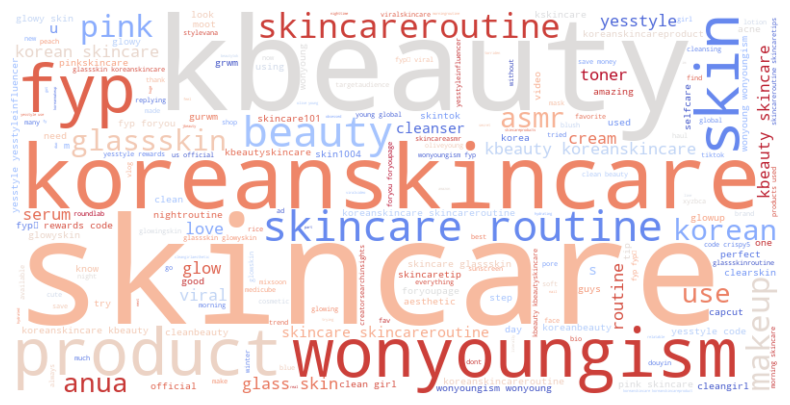

In [99]:
# keyword_df 영상설명 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(keyword_df['cleaned_info'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Information")
plt.show()

In [100]:
# keyword_df 해시태그 일렬로 정렬
tag_final_list = []
for i in range(len(keyword_df)):
    tags = str(keyword_df['hash_tag'][i])
    tags_list = tags.split(',')
    tag_final_list.append(tags_list)
tag_flat_list = sum(tag_final_list,[])
tag_df = pd.DataFrame({'tag':tag_flat_list})
tag_df

,tag
0,@user8022071884889
1,#greenscreen
2,#cleansers
3,#skincare
4,#beauty
...,...
6563,#koreanskincare
6564,#gurwm
6565,#gurwmroutine
6566,#grwm


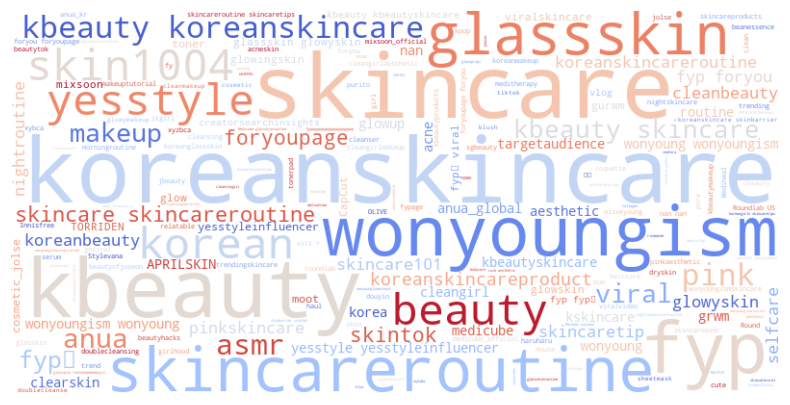

In [101]:
# keyword_df 해시태그 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(tag_df['tag'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Hash_tag")
plt.show()

##### 1-2. 자주 노출되는 인플루언서
- kbeauty인플루언서들 최신 영상 30개씩 추출할 때 사용 -> tiktoker_df생성
- 편의상 tiktoker_df 전처리도 위에서 진행함

In [102]:
# Float 형식을 일반 숫자 형식으로 변경
pd.options.display.float_format = '{:.2f}'.format

In [103]:
# kbeauty관련 키워드들 입력시 알고리즘에 의해 노출되는 모든 인플루언서들
keyword_df['tiktoker_name'].nunique()

358

In [104]:
# kbeauty관련 키워드들 입력 시 틱톡 알고리즘에 의해 3번 이상 노출된 인풀루우언서들
# 58명 / 358명명 -> tiktoker_df만들 때 사용됨 
tiktoker_cnt = keyword_df['tiktoker_name'].value_counts().reset_index()
tiktoker_cnt[tiktoker_cnt['count'] >= 3]

,tiktoker_name,count
0,mydelicate,37
1,velcroluv,33
2,caspertheghostyy,20
3,bwnniewony,17
4,milkydew,15
5,aeiezo.pdf,15
6,emchu_,14
7,songofskin,13
8,4chriisty,13
9,dearwonii_,11


##### 1-3. 업로드 일자

In [105]:
# upload_date를 20YY-MM 형식으로 변환
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(keyword_df)

In [106]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()
date_groupby

,upload_y_m,search_term
0,2020-02,1
1,2020-03,2
2,2020-05,2
3,2020-11,1
4,2021-02,1
5,2021-03,1
6,2021-05,1
7,2021-06,1
8,2021-07,2
9,2021-08,2


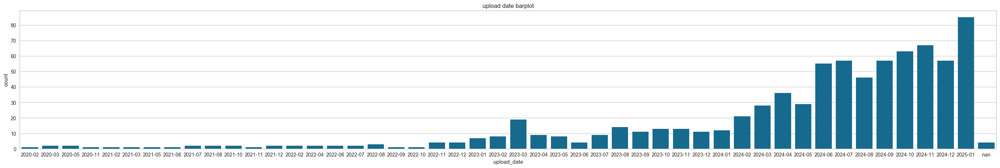

In [107]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='search_term', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

In [108]:
keyword_df.search_term.value_counts()

search_term
clean_beauty         200
kbeauty skin care    199
korean skincare      197
glow skin            187
Name: count, dtype: int64

##### 1-4. 최근 6개월 영상들 k-beauty관련 주요 해시태그

In [109]:
# 1️⃣ 최근 6개월 데이터 필터 + hash_tag - NaN 제거
recent_df = keyword_df[keyword_df['upload_date']>='2024-06-01']
recent_df = recent_df[recent_df['hash_tag'].notna()]
recent_df.head(3)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
1,clean_beauty,2,therealkatiestone,2025-01-03,1337,102,189,#greenscreen new year new diagram #cleansers #...,"#greenscreen,#cleansers,#skincare,#beauty,#bea...",greenscreen new year new diagram cleansers ski...,greenscreencleansersskincarebeautybeautybrandw...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,2025-01-03,2025-01
4,clean_beauty,5,labmuffinbeautyscience,2024-06-22,5634,104,542,Clean beauty isn’t making products safer - tha...,#skincarescience,clean beauty isn’t making products safer that...,skincarescience,"[clean, beauty, isn, ’, t, making, products, s...",[skincarescience],"[clean, ’, making, products, safer, ’, problem...",[skincarescience],"[clean, ’, make, product, safer, ’, problem, m...",[skincaresci],2024-06-22,2024-06


In [110]:
# 해시태그만 추출 (# 유지)
def extract_hashtags(text):
    if isinstance(text, str):
        return re.findall(r'#\w+', text)
    return []


recent_df['tag_list'] = recent_df['hash_tag'].apply(extract_hashtags)

# 3️⃣ 리스트 형태를 개별 행으로 변환
tag_df = recent_df.explode('tag_list')[['tag_list']].rename(columns={'tag_list': 'tag'})

# 4️⃣ 공백 제거
tag_df = tag_df[tag_df['tag'].str.strip() != ""]

# 5️⃣ 태그별 등장 횟수 계산
tag_counts = tag_df['tag'].value_counts()

tag_counts


tag
#kbeauty            286
#koreanskincare     253
#skincare           247
#wonyoungism        194
#fyp                134
                   ... 
#kematian             1
#renungan             1
#v11ambassador        1
#mizonambassador      1
#gurwmroutine         1
Name: count, Length: 784, dtype: int64

In [111]:
tag_count =  tag_df["tag"].value_counts().reset_index()
tag_count = tag_count[tag_count['count'] >= 5]
tag_count

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
...,...,...
130,#xybca,5
131,#glassskincare,5
132,#beautyofjoseon,5
133,#skincareviral,5


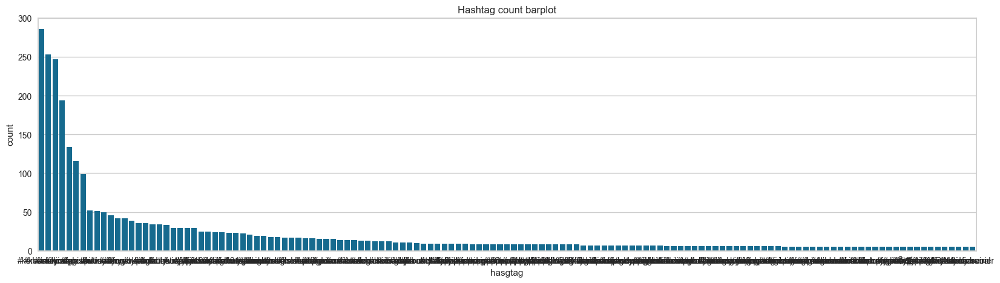

In [112]:
fig, axes = plt.subplots(figsize=(20, 5), sharex=False)
sns.barplot(x='tag', y='count', data=tag_count)
plt.title('Hashtag count barplot')
plt.xlabel('hasgtag')
plt.ylabel('count')
plt.show()

In [113]:
# 최근 6개월 상위 35개 해시태그
tag_count[tag_count['count']>=20]
# skincare, koreanskincare, kbeauty
# skincareroutine, glassskin, 
# glowyskin, viral, skintok, cleanbeauty, skincaretips, asmr, glowup, anua, pink, clearskin

# 우리 회사랑 잘 어울리는 해시태그
# skintok, #ASMR, #skincare

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
5,#skincareroutine,116
6,#glassskin,99
7,#pink,52
8,#korean,51
9,#wonyoung,50


In [114]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='object')

In [115]:
# 최근 6개월 태그 별 영상 수 및 총 좋아요 수 계산

recent_df['hash_tag'] = recent_df['hash_tag'].astype(str)

# 태그별 영상 수 및 총 좋아요 수 계산
tag_count['video_cnt'] = 0
tag_count['total_like'] = 0

recent_df['idx'] = recent_df.index

for i in range(len(tag_count)):
    tag = tag_count.loc[i, 'tag']

    # 🎯 해시태그 문자열을 리스트로 변환 (정확 비교를 위함)
    recent_df['tag_list'] = recent_df['hash_tag'].str.split(',').apply(
        lambda lst: [t.strip() for t in lst] if isinstance(lst, list) else []
    )

    # 🎯 해당 태그를 정확히 포함하는 영상만 필터링
    matched_videos = recent_df[recent_df['tag_list'].apply(lambda tags: tag in tags)].copy()

    # 영상 수 (unique)
    tag_count.loc[i, 'video_cnt'] = matched_videos['idx'].nunique()

    # 총 좋아요 (중복 제거 후 영상 단위 합산)
    tag_count.loc[i, 'total_like'] = matched_videos.groupby('idx')['like_cnt'].first().sum()

# 결과 출력
display(tag_count)


,tag,count,video_cnt,total_like
0,#kbeauty,286,282,14320598
1,#koreanskincare,253,249,21891260
2,#skincare,247,247,12822407
3,#wonyoungism,194,191,8441067
4,#fyp,134,134,6266383
...,...,...,...,...
130,#xybca,5,5,136616
131,#glassskincare,5,5,114800
132,#beautyofjoseon,5,5,152693
133,#skincareviral,5,5,16303


In [116]:
# 최근 6개월 해시태그별 평균 좋아요수
tag_count['like_mean'] = tag_count['total_like']/tag_count['video_cnt']
tag_count

,tag,count,video_cnt,total_like,like_mean
0,#kbeauty,286,282,14320598,50782.26
1,#koreanskincare,253,249,21891260,87916.71
2,#skincare,247,247,12822407,51912.58
3,#wonyoungism,194,191,8441067,44194.07
4,#fyp,134,134,6266383,46764.05
...,...,...,...,...,...
130,#xybca,5,5,136616,27323.20
131,#glassskincare,5,5,114800,22960.00
132,#beautyofjoseon,5,5,152693,30538.60
133,#skincareviral,5,5,16303,3260.60


In [117]:
# 최근 6개월간 해시태그별 영상 수 (Top 5)
# video_cnt 기준 상위 20% threshold 계산
threshold = tag_count['video_cnt'].quantile(0.80)

# 상위 20% 해시태그 추출
top20_usage_tags = (
    tag_count[tag_count['video_cnt'] >= threshold]
    .sort_values('video_cnt', ascending=False)
)

cols = ['tag','video_cnt','total_like','like_mean']

top20_usage_tags[cols]

,tag,video_cnt,total_like,like_mean
0,#kbeauty,282,14320598,50782.26
1,#koreanskincare,249,21891260,87916.71
2,#skincare,247,12822407,51912.58
3,#wonyoungism,191,8441067,44194.07
4,#fyp,134,6266383,46764.05
5,#skincareroutine,114,9362016,82122.95
6,#glassskin,98,5042599,51455.09
7,#pink,52,2621321,50410.02
8,#korean,51,1754938,34410.55
9,#wonyoung,50,1872888,37457.76


In [118]:
tag_count.columns

Index(['tag', 'count', 'video_cnt', 'total_like', 'like_mean'], dtype='object')

---- 

한국 키워드 들어간 태그와 그렇지 않은 태그들의 평균 좋아요 비율

In [119]:
# 해시태그별 영상 지표 리스트 생성

import numpy as np
import pandas as pd
from collections import defaultdict

# 해시태그 리스트 변환
recent_df['tag_list'] = recent_df['hash_tag'].astype(str).str.split(',').apply(
    lambda lst: [t.strip().lower() for t in lst] if isinstance(lst, list) else []
)

# 해시태그별 지표 집계용
tag_to_metrics = defaultdict(lambda: {'like': [], 'comment': [], 'save': []})

for idx, row in recent_df.iterrows():
    for tag in row['tag_list']:
        tag_to_metrics[tag]['like'].append(row['like_cnt'])
        tag_to_metrics[tag]['comment'].append(row['comment_cnt'])
        tag_to_metrics[tag]['save'].append(row['save_cnt'])

# 데이터프레임으로 변환
tag_metrics_df = pd.DataFrame([
    {
        'tag': tag,
        'like_mean': np.mean(metrics['like']),
        'comment_mean': np.mean(metrics['comment']),
        'save_mean': np.mean(metrics['save']),
        'video_cnt': len(metrics['like'])
    }
    for tag, metrics in tag_to_metrics.items()
])


In [120]:
# k_keyword 포함 여부 컬럼 추가
k_keyword = ["kbeauty", "korean", "wonyoung"]

def has_k_keyword(tag):
    return any(k in tag for k in k_keyword)

tag_metrics_df['group'] = tag_metrics_df['tag'].apply(lambda t: 'k_keyword' if has_k_keyword(t) else 'others')

In [121]:
# 1️⃣ 그룹별 평균 확인
grouped = tag_metrics_df.groupby('group')[['like_mean','comment_mean','save_mean']].mean()
print("그룹별 평균값:")
print(grouped)

그룹별 평균값:
           like_mean  comment_mean  save_mean
group                                        
k_keyword   85038.23        981.86   19551.64
others      82705.22        579.01   14263.93


In [122]:
# 2️⃣ 증가율 계산 (k_keyword vs others)
increase_pct = ((grouped.loc['k_keyword'] - grouped.loc['others']) / grouped.loc['others'] * 100).round(2)

print("\nk_keyword 포함 해시태그가 없는 해시태그 대비 평균 증가율(%)")
print(increase_pct)


k_keyword 포함 해시태그가 없는 해시태그 대비 평균 증가율(%)
like_mean       2.82
comment_mean   69.58
save_mean      37.07
dtype: float64


In [123]:
# 3️⃣ 문장 형태로 출력
for metric in ['like_mean','comment_mean','save_mean']:
    pct = increase_pct[metric]
    print(f"{metric.replace('_mean','').capitalize()} 수: k_keyword 그룹이 others 그룹 대비 {pct}% 더 높다.")

Like 수: k_keyword 그룹이 others 그룹 대비 2.82% 더 높다.
Comment 수: k_keyword 그룹이 others 그룹 대비 69.58% 더 높다.
Save 수: k_keyword 그룹이 others 그룹 대비 37.07% 더 높다.


통계 검정 (독립표본 비교)

In [124]:
from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

def compare_groups(metric):
    group_A = tag_metrics_df[tag_metrics_df['group']=='k_keyword'][metric]
    group_B = tag_metrics_df[tag_metrics_df['group']=='others'][metric]

    # 정규성
    pA = shapiro(group_A)[1]
    pB = shapiro(group_B)[1]

    # 등분산성
    p_levene = levene(group_A, group_B)[1]

    # 검정 선택
    if pA > 0.05 and pB > 0.05:
        if p_levene > 0.05:
            test, p = ttest_ind(group_A, group_B, equal_var=True)
            method = f"{metric} 독립표본 t-test(등분산)"
        else:
            test, p = ttest_ind(group_A, group_B, equal_var=False)
            method = f"{metric} Welch t-test(이분산)"
    else:
        test, p = mannwhitneyu(group_A, group_B, alternative='two-sided')
        method = f"{metric} Mann-Whitney U test (비모수)"

    print(f"{method} → 통계량: {test:.3f}, p-value: {p:.4f}")

# 좋아요, 댓글, 저장 각각 검정
for metric in ['like_mean','comment_mean','save_mean']:
    compare_groups(metric)


like_mean Mann-Whitney U test (비모수) → 통계량: 24888.500, p-value: 0.0086
comment_mean Mann-Whitney U test (비모수) → 통계량: 26855.500, p-value: 0.0002
save_mean Mann-Whitney U test (비모수) → 통계량: 25492.000, p-value: 0.0030


---

In [125]:
# 1) 영상 수가 적어 의미 없는 평균 제거
Q1 = tag_count["video_cnt"].quantile(0.25)
filtered = tag_count[tag_count["video_cnt"] >= Q1]

# 2) like_mean 기준 상위 20% threshold
threshold = filtered['like_mean'].quantile(0.80)

# 3) filtered 안에서 상위 20% 선택
top20_liked_tags = (
    filtered[filtered['like_mean'] >= threshold]
    .sort_values('like_mean', ascending=False)
)

top20_liked_tags[cols]

,tag,video_cnt,total_like,like_mean
68,#makeuptutorial,8,4542391,567798.88
61,#cleansing,9,5066818,562979.78
81,#pores,7,3847000,549571.43
72,#doublecleansing,8,2911829,363978.62
48,#cleanser,12,3758830,313235.83
40,#mixsoon,15,4239969,282664.60
14,#skintok,35,9610627,274589.34
31,#toner,19,5191910,273258.42
101,#beautyinfluencer,6,1315900,219316.67
30,#grwm,21,4260013,202857.76


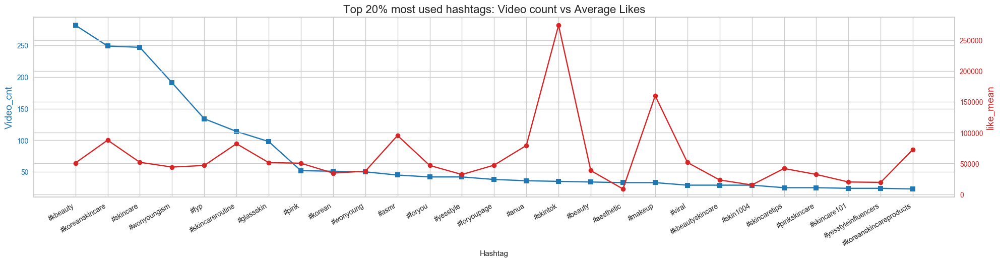

In [126]:
# 최근 6개월 사용량 상위20% 해시태그들의 사용된 영상 개수 대비 평균 좋아요 수

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title('Top 20% most used hashtags: Video count vs Average Likes', fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_usage_tags.tag, top20_usage_tags.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_usage_tags.tag, top20_usage_tags.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

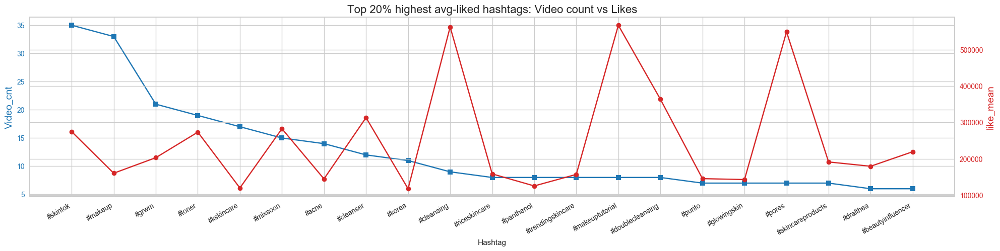

In [127]:
# 최근 6개월 좋아요 평균 상위20% 해시태그들의 사용된 영상 개수 대비 좋아요 수 + 영상 수가 적어 의미 없는 평균 제거됨

# video_cnt 기준 내림차순 정렬
top20_liked_tags_sorted = top20_liked_tags.sort_values('video_cnt', ascending=False).reset_index(drop=True)

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title("Top 20% highest avg-liked hashtags: Video count vs Likes", fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

In [128]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='object')

In [129]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag'],
      dtype='object')

# typo 주의
 micro_influancer', 'mega_influancer', 'middle_influancer','mekro_influancer', 'nano_influancer

In [130]:
# 최소 광고비용 컬럼 파생변수 생성
def min_ad_cost_range(df):
    for i in range(len(df)):
        if df['follower_cnt'][i] >= 1000000:
            df.loc[i, 'tiktoker_size'] = 'mega_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000 # 숫자로 설정
        elif df['follower_cnt'][i] >= 500000:
            df.loc[i, 'tiktoker_size'] = 'mekro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 100000:
            df.loc[i, 'tiktoker_size'] = 'middle_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 10000:
            df.loc[i, 'tiktoker_size'] = 'micro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 1000:
            df.loc[i, 'tiktoker_size'] = 'nano_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        else:
            df.loc[i, 'tiktoker_size'] = 'under_influancer'
            df.loc[i, 'ad_cost'] = 0 
min_ad_cost_range(tiktoker_df)

In [131]:
tiktoker_df.tiktoker_size.value_counts()

tiktoker_size
middle_influancer    630
micro_influancer     600
mega_influancer      240
nano_influancer      150
mekro_influancer      60
Name: count, dtype: int64

In [132]:
temp_df = (
    keyword_df
    .merge(tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name')
    .drop(columns=['name'])
)

temp_df.tiktoker_size.unique()

array(['micro_influancer', 'mega_influancer', 'middle_influancer',
       'mekro_influancer', 'nano_influancer'], dtype=object)


=== micro_influancer ===


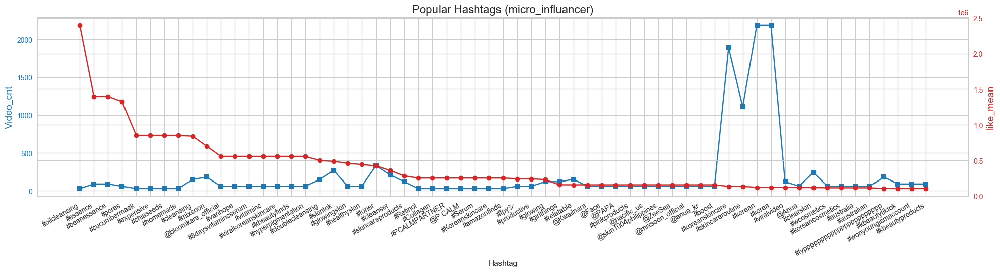


=== mega_influancer ===


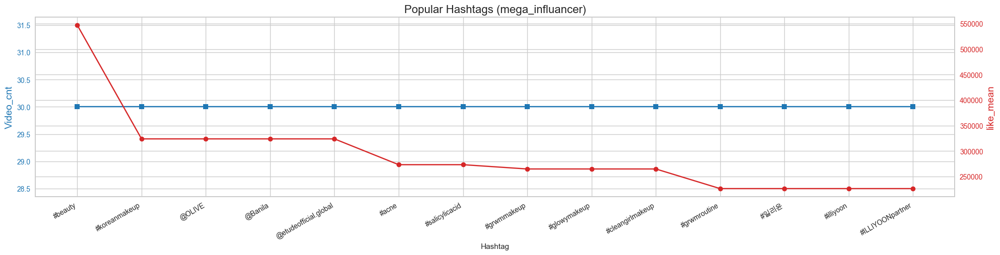


=== middle_influancer ===


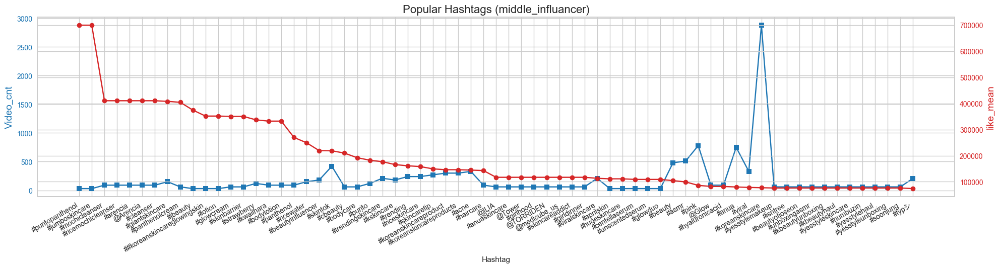


=== mekro_influancer ===


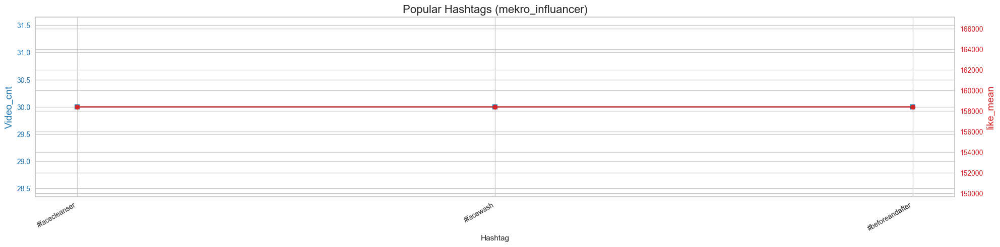


=== nano_influancer ===


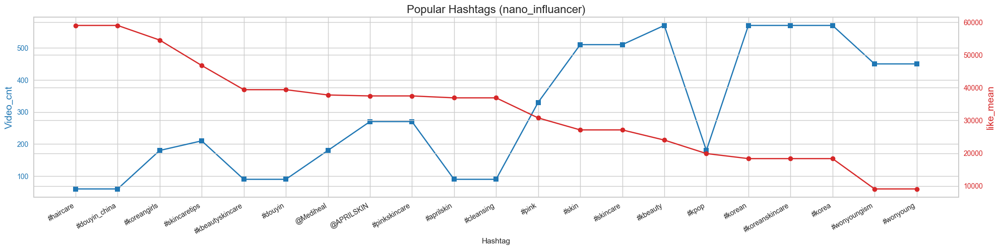

In [133]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_hashtags_by_size(keyword_df, tiktoker_df, size, recent_date='2024-06-01', min_tag_count=5, top_percent=0.2):
    """
    단일 인플루언서 사이즈별 해시태그 분석 및 시각화
    """
    # 1) 병합
    temp_df = keyword_df.merge(
        tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name'
    ).drop(columns=['name'])
    
    # 2) 사이즈 필터링
    temp_df = temp_df[temp_df['tiktoker_size'] == size].copy()
    
    # 3) 최근 영상 필터링
    recent_df = temp_df[temp_df['upload_date'] >= recent_date].copy()
    recent_df['hash_tag'] = recent_df['hash_tag'].astype(str).fillna('')
    
    # 4) 해시태그 분리
    txt = ",".join(recent_df['hash_tag'])
    tag_df = pd.DataFrame(txt.split(","), columns=['tag'])
    tag_df = tag_df[tag_df['tag'].str.strip() != ""]
    
    # 5) 태그 등장 횟수 필터링
    tag_count = tag_df['tag'].value_counts().reset_index()
    tag_count.columns = ['tag', 'count']
    tag_count = tag_count[tag_count['count'] >= min_tag_count].reset_index(drop=True)
    
    # 6) 영상 수, 총 좋아요 계산
    recent_df['idx'] = recent_df.index
    tag_count['video_cnt'] = 0
    tag_count['total_like'] = 0
    for i in range(len(tag_count)):
        tag = tag_count.loc[i, 'tag']
        matched_videos = recent_df[recent_df['hash_tag'].str.contains(tag, regex=False)].copy()
        tag_count.loc[i, 'video_cnt'] = matched_videos['idx'].nunique()
        tag_count.loc[i, 'total_like'] = matched_videos.groupby('idx')['like_cnt'].first().sum()
    
    # 7) 평균 좋아요
    tag_count['like_mean'] = tag_count['total_like'] / tag_count['video_cnt']
    
    # 8) 상위 n% 태그만 필터링
    n_tags = max(1, int(len(tag_count) * top_percent))
    temp = tag_count.sort_values('like_mean', ascending=False).head(n_tags).reset_index(drop=True)
    
    # 9) 시각화
    fig, ax1 = plt.subplots(figsize=(20,5))
    color_1 = 'tab:blue'
    ax1.set_title(f'Popular Hashtags ({size})', fontsize=16)
    ax1.set_xlabel('Hashtag')
    ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
    ax1.plot(temp.tag, temp.video_cnt, marker='s', color=color_1)
    ax1.tick_params(axis='y', labelcolor=color_1)

    ax2 = ax1.twinx()
    color_2 = 'tab:red'
    ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
    ax2.plot(temp.tag, temp.like_mean, marker='o', color=color_2)
    ax2.tick_params(axis='y', labelcolor=color_2)
    
    plt.xticks(rotation=45)
    fig.tight_layout()
    fig.autofmt_xdate()
    plt.show()
    
    return tag_count

# 각 사이즈별 분석 반복
sizes = ['micro_influancer', 'mega_influancer', 'middle_influancer', 'mekro_influancer', 'nano_influancer']

size_tag_counts = {}
for sz in sizes:
    print(f"\n=== {sz} ===")
    size_tag_counts[sz] = analyze_hashtags_by_size(
        keyword_df, tiktoker_df, 
        size=sz, recent_date='2024-06-01',
        min_tag_count=5,
        top_percent=0.2
    )


In [134]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='object')

#### 2. tiktoker_df

##### 2-1. 인플루언서 사이즈 구분 및 광고 단가 추정치
- 나노 인플루언서 (1,000–10,000 팔로워): 게시물당 $5~$25
- 마이크로 인플루언서 (10,000–100,000 팔로워): 게시물당 $25~$125
- 중간급 인플루언서 (100,000–500,000 팔로워): 게시물당 $125~$1,200
- 매크로 인플루언서 (500,000–1백만 팔로워): 게시물당 $1,200~$2,500
- 메가 인플루언서 (1백만+ 팔로워): 게시물당 $2,500 이상

##### 2-2. 평균 업로드 주기 계산(파생변수 생성)

In [135]:
import pandas as pd
import numpy as np
import re
from datetime import datetime, timedelta

# ✅ 현재 날짜 기준
TODAY = datetime(2025, 1, 27)  # 현재 날짜 설정

# ✅ 'date' 열을 변환하는 함수 (에러 방지 추가)
def parse_date(date_str):
    date_str = str(date_str).strip().lower()  # 공백 제거, 소문자 변환

    # 1️⃣ MM-DD 형식 변환 (예: "1-14" → 2025-01-14)
    match_mmdd = re.fullmatch(r"(\d{1,2})-(\d{1,2})", date_str)
    if match_mmdd:
        month, day = map(int, match_mmdd.groups())  # 월, 일 추출
        return datetime(2025, month, day)  # 2025년으로 변환

    # 2️⃣ 숫자 + 단위(h, d, w) 변환 (예: "14h", "3d", "2w")
    match_relative = re.fullmatch(r"(\d+)([hdw])(?:\s*ago)?", date_str)  # " ago" 처리 추가
    if match_relative:
        num, unit = int(match_relative.group(1)), match_relative.group(2)  # 숫자, 단위 분리
        
        if unit == "h":  # 시간 단위
            return TODAY - timedelta(hours=num)
        elif unit == "d":  # 일 단위
            return TODAY - timedelta(days=num)
        elif unit == "w":  # 주 단위 (1주 = 7일)
            return TODAY - timedelta(weeks=num)

    # 3️⃣ 날짜 형식(YYYY-MM-DD) 변환
    try:
        return pd.to_datetime(date_str)  # YYYY-MM-DD 형식 변환
    except Exception as e:
        print(f"Failed to parse date: {date_str}. Error: {e}")
        return np.nan  # 변환 실패 시 NaT 반환

# ✅ 'date' 열 변환
tiktoker_df["upload_date"] = tiktoker_df["upload_date"].apply(parse_date)

# ✅ name 별로 업로드 간격 계산
tiktoker_df = tiktoker_df.sort_values(by=["name", "upload_date"])  # 이름 + 날짜순 정렬
tiktoker_df["prev_date"] = tiktoker_df.groupby("name")["upload_date"].shift(1)  # 이전 영상 날짜
tiktoker_df["upload_gap"] = (tiktoker_df["upload_date"] - tiktoker_df["prev_date"]).dt.days  # 간격(일)

# ✅ 평균 업로드 주기 계산
upload_cycle = tiktoker_df.groupby("name")["upload_gap"].mean().reset_index()
upload_cycle.rename(columns={"upload_gap": "avg_upload_interval"}, inplace=True)

# ✅ 결과 출력
print(upload_cycle)

                 name  avg_upload_interval
0       .blissdiaries                 4.07
1             .m.egan                 5.03
2            .woniluv                 2.38
3           4chriisty                 2.48
4          __.annie.s                 3.14
5         _luvwonsnnx                 1.48
6          aeiezo.pdf                 3.48
7     ameenbeautytips                 0.17
8           amyflamy1                 1.45
9           asiamelon                 3.34
10           ayheyt3u                 5.76
11         aylennpark                 1.62
12         bwnniewony                 1.93
13   caspertheghostyy                 0.83
14     cleangirlhacks                 3.03
15   cleanlivingkarly                 0.55
16         danicolexx                 0.31
17         dearwonii_                 2.66
18             emchu_                 3.41
19          fromh1ae_                 2.21
20            gae4hrv                 3.59
21     glowupwithinah                 0.24
22         

In [136]:
tiktoker_df[ tiktoker_df.name == "dearwonii_"]

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap
329,dearwonii_,217100.00,2024-11-04,534100,11900,251,2198,Your sign to literally exfoliate! Exfoliating ...,"#tonerpad,#exfoliate,#pores,##skincare,#kbeaut...",your sign to literally exfoliate exfoliating c...,...,"[your, sign, to, literally, exfoliate, exfolia...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, literally, exfoliate, exfoliating, help...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, liter, exfoli, exfoli, help, remov, pre...",[tonerpadexfoliateporesskincarekbeautybeautyto...,middle_influancer,4342000000.00,NaT,NaN
328,dearwonii_,217100.00,2024-11-07,109300,13400,430,1772,One of my favorite beauty supplements! 2 jars ...,"#beautysupplement,#beauty,#glasskin,#fyp,#fypシ...",one of my favorite beauty supplements 2 jars d...,...,"[one, of, my, favorite, beauty, supplements, 2...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorite, supplements, 2, jars, down🤭sof...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorit, supplement, 2, jar, down🤭softgl...",[beautysupplementbeautyglasskinfypfypシtargetaudi],middle_influancer,4342000000.00,2024-11-04,3.00
327,dearwonii_,217100.00,2024-11-14,62500,4295,219,522,the cream I only trust with my sensitive skin!...,"@일리윤,#illiyoon,#skincare,#kbeauty,#amazonfinds...",the cream i only trust with my sensitive skin ...,...,"[the, cream, i, only, trust, with, my, sensiti...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensitive, loving, cream, latel...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensit, love, cream, late, real...",[illiyoonskincarekbeautyamazonfindssensitivesk...,middle_influancer,4342000000.00,2024-11-07,7.00
326,dearwonii_,217100.00,2024-11-16,2000000,42300,450,3673,Everything in my skincare that I use in order ...,"#TikTokSuperBrandDay,#skincareroutine,#skin100...",everything in my skincare that i use in order ...,...,"[everything, in, my, skincare, that, i, use, i...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everything, use, order, achieve, glowy, clear...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everyth, use, order, achiev, glowi, clear, en...",[tiktoksuperbranddayskincareroutineskin1004kbe...,middle_influancer,4342000000.00,2024-11-14,2.00
325,dearwonii_,217100.00,2024-11-18,58700,4491,178,609,noni fruit is all my skin needs! Definitely my...,"#ampoule,#nonifruit,#skincare,#kbeauty,#beauty...",noni fruit is all my skin needs definitely my ...,...,"[noni, fruit, is, all, my, skin, needs, defini...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, needs, definitely, savior, ampou...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, need, definit, savior, ampoulece...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,middle_influancer,4342000000.00,2024-11-16,2.00
324,dearwonii_,217100.00,2024-11-21,71800,4434,197,521,If the popular COSRX snail mucin essence didn’...,"#ksecret,#skincare,#kbeauty,#beauty,#fypシ,#fyp...",if the popular cosrx snail mucin essence didn’...,...,"[if, the, popular, cosrx, snail, mucin, essenc...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essence, ’, wor...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essenc, ’, work...",[ksecretskincarekbeautybeautyfypシfyptargetaudi],middle_influancer,4342000000.00,2024-11-18,3.00
323,dearwonii_,217100.00,2024-11-22,75100,8024,358,918,grwm for a holiday!(winter edition❄️)#grwm #ma...,"#makeup,#winter,#beauty,#beautytok,#fypシ,#fyp,...",grwm for a holidaywinter edition❄️grwm makeup ...,...,"[grwm, for, a, holidaywinter, edition❄️grwm, m...",[makeupwinterbeautybeautytokfypシfyptargetaudie...,"[grwm, holidaywinter, edition❄️grwm, makeup,

In [137]:
# 1차 차분
tiktoker_df["upload_gap_diff"] = tiktoker_df.groupby("name")["upload_gap"].diff()
#그룹별 평균 변화량 한 번에 적용
tiktoker_df["avg_upload_gap_change"] = tiktoker_df.groupby("name")["upload_gap_diff"].transform("mean")


In [138]:
tiktoker_df.groupby('name')['upload_gap'].mean()

name
.blissdiaries        4.07
.m.egan              5.03
.woniluv             2.38
4chriisty            2.48
__.annie.s           3.14
_luvwonsnnx          1.48
aeiezo.pdf           3.48
ameenbeautytips      0.17
amyflamy1            1.45
asiamelon            3.34
ayheyt3u             5.76
aylennpark           1.62
bwnniewony           1.93
caspertheghostyy     0.83
cleangirlhacks       3.03
cleanlivingkarly     0.55
danicolexx           0.31
dearwonii_           2.66
emchu_               3.41
fromh1ae_            2.21
gae4hrv              3.59
glowupwithinah       0.24
haruqhxz             5.62
heartsfor.kbeauty    2.59
its.kaylas           1.31
itsedonna            1.31
izzydiaries          3.38
jaerini              9.14
jasminnlily_         2.24
jeb_bi               1.86
koocat               1.72
krystallee2222       2.24
kwyeona              2.31
lovelymiri05         0.62
luvsfor.jennie       1.21
milkydew             0.52
minseonk1m           0.83
misscasxie           4.48
monakoa

##### 2-3. 업로드 일자 확인

In [139]:
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(tiktoker_df)

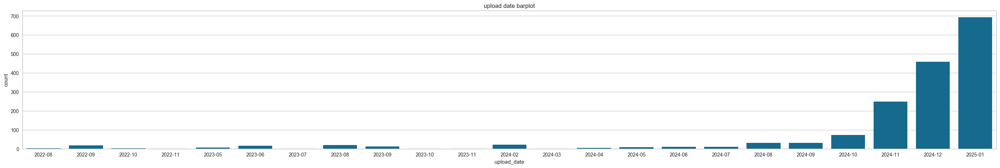

In [140]:
date_groupby = tiktoker_df.groupby('upload_y_m')['name'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='name', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

##### 2-4. 인플루언서별 정량적 지표 구하기

In [141]:
tiktoker_df.count()

name                       1680
follower_cnt               1680
upload_date                1680
view_cnt                   1680
like_cnt                   1680
comment_cnt                1680
save_cnt                   1680
info                       1664
hash_tag                   1620
cleaned_info               1664
cleaned_hash_tag           1620
tokenized_info             1664
tokenized_hash_tag         1620
removed_info               1664
removed_hash_tag           1620
stpw_processed_info        1664
stpw_processed_hash_tag    1620
tiktoker_size              1680
ad_cost                    1680
prev_date                  1624
upload_gap                 1624
upload_gap_diff            1568
avg_upload_gap_change      1680
upload_date_str            1680
upload_y_m                 1680
dtype: int64

In [142]:
len(tiktoker_df.name.unique())

56

In [143]:
# 인플루언서 선정은 ‘사람(계정)’ 단위로 이루어진다 그러므로 계정 전체의 평균 성과(Mean Engagement)를 보는 것이 자연스럽다

mean_df = tiktoker_df.groupby('name').agg({'follower_cnt':'mean',
                                    'view_cnt':'mean',
                                    'like_cnt':'mean',
                                    'comment_cnt':'mean',
                                    'save_cnt':'mean',
                                    'upload_gap':'mean',
                                    'tiktoker_size': 'max',
                                    'ad_cost':"mean"
                                    }).reset_index()
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [144]:
mean_df.count()

name             56
follower_cnt     56
view_cnt         56
like_cnt         56
comment_cnt      56
save_cnt         56
upload_gap       56
tiktoker_size    56
ad_cost          56
dtype: int64

In [145]:
min_ad_cost_range(mean_df)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [146]:
# ER 구하기
# ER : ((좋아요 수 + 댓글 수) / 팔로워 수) * 100
mean_df['ER'] = ((mean_df['like_cnt']+mean_df['comment_cnt'])/mean_df['follower_cnt'])*100


# ERV 구하기
# ERV : ((좋아요 수 + 댓글 수 + 저장 수) / 조회수) * 100
mean_df['ERV'] = (mean_df['like_cnt'] + mean_df['comment_cnt'] + mean_df['save_cnt']) / mean_df['view_cnt'] * 100
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost,ER,ERV
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00,1.85,17.53
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00,10.10,15.48
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00,1.83,6.80


In [147]:
cols = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ER", "ERV"]

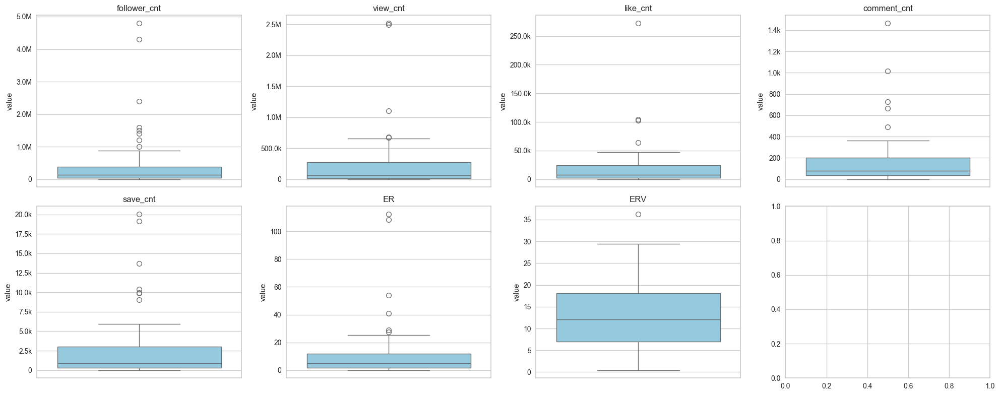

In [148]:
import matplotlib.ticker as mtick

def human_format(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:.1f}M'
    elif x >= 1e3:
        return f'{x*1e-3:.1f}k'
    else:
        return f'{x:.0f}'

formatter = mtick.FuncFormatter(human_format)


fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=mean_df[col], ax=ax, color='skyblue')  # 색상 추가
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [149]:
summary_stats = {}

for col in cols :
    summary_stats[col] = {
    "count": mean_df[col].count(),
    "mean": mean_df[col].mean(),
    "median": mean_df[col].median(),
    "std": mean_df[col].std(),
    "min": mean_df[col].min(),
    "max": mean_df[col].max()
    }

summary_df = pd.DataFrame(summary_stats).T
summary_df


,count,mean,median,std,min,max
follower_cnt,56.00,470629.54,142600.00,924280.71,4121.00,4800000.00
view_cnt,56.00,246204.17,59798.30,489895.19,1690.83,2518470.00
like_cnt,56.00,20198.40,7734.62,41024.61,73.27,272720.00
comment_cnt,56.00,174.63,80.58,260.20,0.50,1466.93
save_cnt,56.00,2836.41,920.40,4444.31,0.67,20036.77
ER,56.00,12.00,5.14,21.73,0.03,112.37
ERV,56.00,13.81,12.10,8.02,0.42,36.27


In [150]:
# 아웃라이어를 IQR 방식으로 확인
outlier_info = {}

for col in cols:
    Q1 = mean_df[col].quantile(0.25)
    Q3 = mean_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = mean_df[(mean_df[col] < Q1 - 1.5*IQR) | (mean_df[col] > Q3 + 1.5*IQR)]
    outlier_info[col] = {
        "outlier_count": len(outliers),
        "outlier_ratio": len(outliers)/len(mean_df)
    }

outlier_df = pd.DataFrame(outlier_info).T
print(outlier_df)

              outlier_count  outlier_ratio
follower_cnt           8.00           0.14
view_cnt               5.00           0.09
like_cnt               4.00           0.07
comment_cnt            5.00           0.09
save_cnt               7.00           0.12
ER                     6.00           0.11
ERV                    1.00           0.02


In [151]:
def remove_outlier_rows(df, cols):
    filtered_df = df.copy()
    for col in cols:
        Q1 = filtered_df[col].quantile(0.25)
        Q3 = filtered_df[col].quantile(0.75)
        IQR = Q3 - Q1
        # 한 컬럼이라도 아웃라이어면 제거
        filtered_df = filtered_df[(filtered_df[col] >= Q1 - 1.5*IQR) & (filtered_df[col] <= Q3 + 1.5*IQR)]
    return filtered_df

# 적용
filtered_df = remove_outlier_rows(mean_df, cols)

# 요약 통계 계산
summary_stats = {col: {
    "count": filtered_df[col].count(),
    "mean": filtered_df[col].mean(),
    "median": filtered_df[col].median(),
    "std": filtered_df[col].std(),
    "min": filtered_df[col].min(),
    "max": filtered_df[col].max()
} for col in cols}

summary_df = pd.DataFrame(summary_stats).T.round(2)
summary_df

,count,mean,median,std,min,max
follower_cnt,26.00,149388.46,79200.00,157452.04,13700.00,504500.00
view_cnt,26.00,37231.21,22648.40,39445.00,1690.83,157372.27
like_cnt,26.00,3299.07,2389.07,2843.38,73.27,9439.93
comment_cnt,26.00,61.35,46.02,56.00,0.50,222.23
save_cnt,26.00,528.47,377.65,431.11,0.67,1829.90
ER,26.00,3.73,2.12,3.64,0.05,14.39
ERV,26.00,13.75,14.33,7.72,3.62,28.73


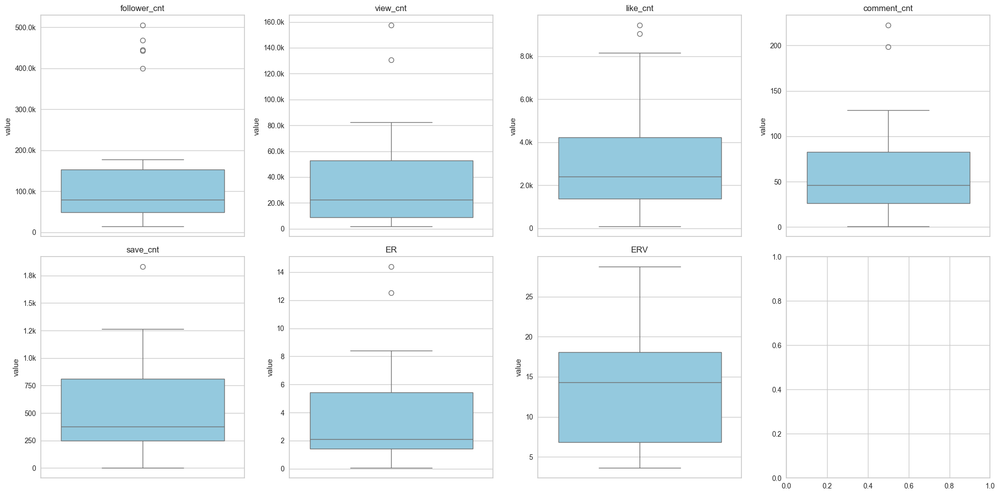

In [152]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=filtered_df[col], ax=ax, color='skyblue')
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()


In [153]:
mean_df.tiktoker_size.unique()

array(['micro_influancer', 'middle_influancer', 'mega_influancer',
       'mekro_influancer', 'nano_influancer'], dtype=object)

In [154]:
size_counts = mean_df.groupby('tiktoker_size')[cols[0]].count()  # cols[0] 아무 컬럼 하나 선택해도 됨
size_counts = size_counts.reset_index().rename(columns={cols[0]: 'count'})
print(size_counts)

       tiktoker_size  count
0    mega_influancer      8
1   mekro_influancer      2
2   micro_influancer     20
3  middle_influancer     21
4    nano_influancer      5


In [155]:
cols

['follower_cnt',
 'view_cnt',
 'like_cnt',
 'comment_cnt',
 'save_cnt',
 'ER',
 'ERV']

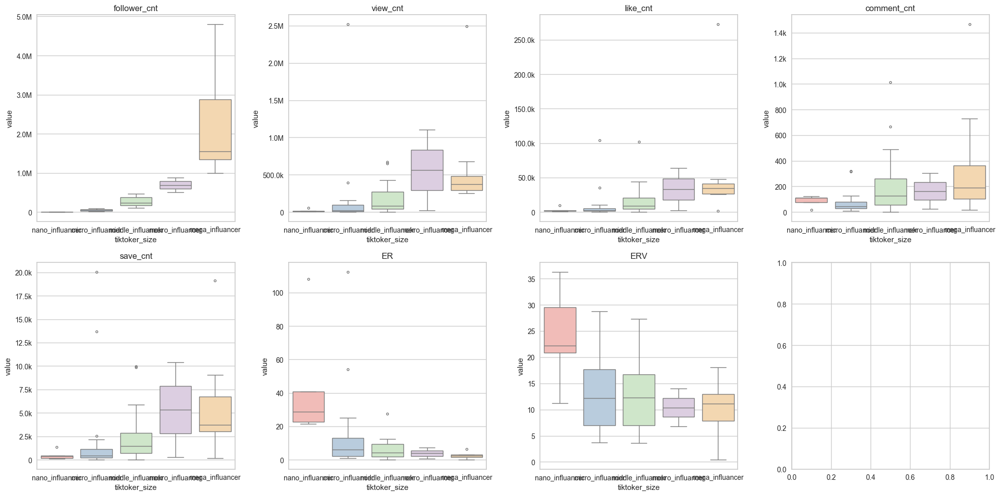

In [156]:
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2,4, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


In [157]:
size_order.reverse()

In [158]:
size_order

['mega_influancer',
 'mekro_influancer',
 'middle_influancer',
 'micro_influancer',
 'nano_influancer']

In [159]:
mean_df.columns

Index(['name', 'follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt',
       'save_cnt', 'upload_gap', 'tiktoker_size', 'ad_cost', 'ER', 'ERV'],
      dtype='object')

✅ 현재 폰트 적용됨: Arial Unicode MS


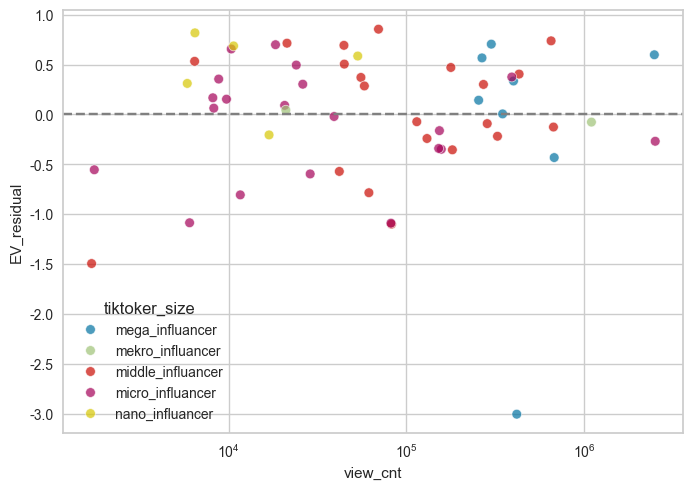

In [160]:
import statsmodels.api as sm
import pltfont
pltfont.auto()

mean_df['EV'] = (
    mean_df['like_cnt']
    + mean_df['comment_cnt']
    + mean_df['save_cnt']
)

X = sm.add_constant(np.log(mean_df['view_cnt']))
y = np.log(mean_df['EV'])

model = sm.OLS(y, X).fit()
mean_df['EV_residual'] = model.resid

sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='EV_residual',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')
plt.axhline(0, color='gray', linestyle='--')

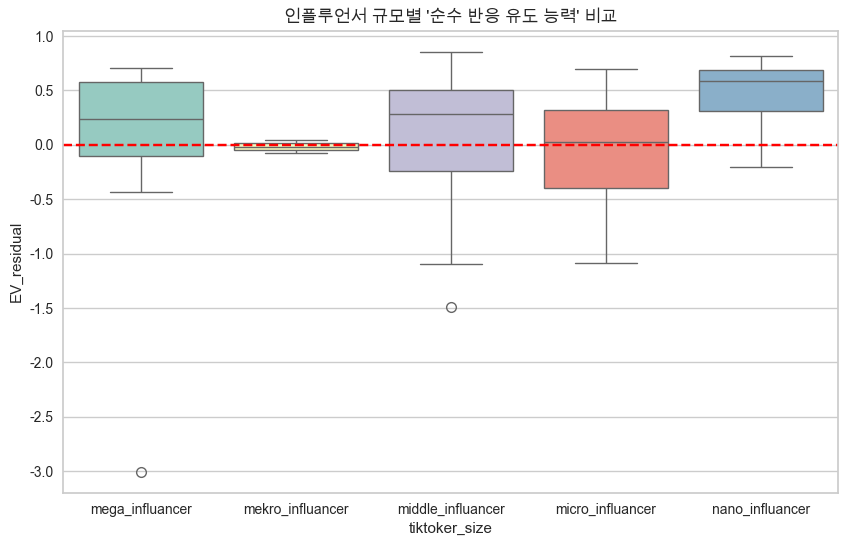

In [161]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=mean_df,
    x='tiktoker_size',
    y='EV_residual',
    order=size_order,
    palette='Set3'
)
plt.axhline(0, color='red', linestyle='--')
plt.title("인플루언서 규모별 '순수 반응 유도 능력' 비교")
plt.show()

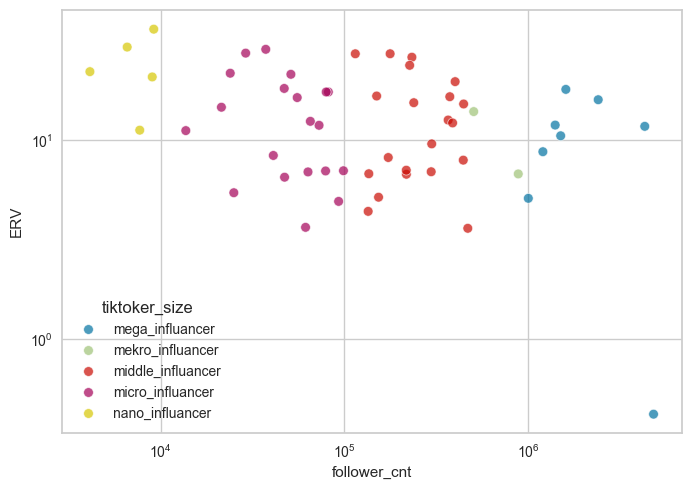

In [162]:
sns.scatterplot(
    data=mean_df,
    x='follower_cnt',
    y='ERV',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

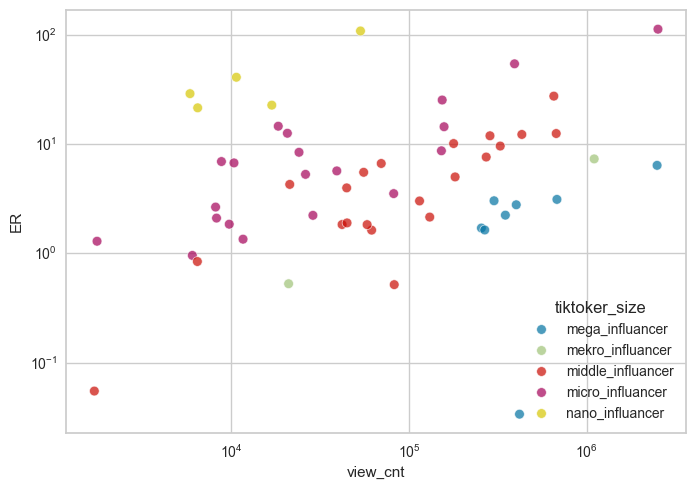

In [163]:
sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='ER',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

---

### 마케팅 비용으로 환산해보자.

In [164]:
k_keyword = ["kbeauty", "korean", "wonyoung","korea"]

tmp_df = tiktoker_df.copy()
tmp_df['group'] = tmp_df['hash_tag'].astype(str).apply(
    lambda x: 'k_keyword' if any(k in x for k in k_keyword) else 'others'
)
tmp_df['group'].value_counts()

group
k_keyword    986
others       694
Name: count, dtype: int64

ER / ERV 지표 정의 및 계산

- **ER (Engagement Rate, 팔로워 기반 참여율)**  
  - 정의: 한 콘텐츠의 총 참여 행동(좋아요+댓글+저장)을 팔로워 수로 나눈 비율  
  - 계산 목적: 계정 규모 차이를 보정하여 콘텐츠 반응성을 비교  
  - 해석: 단순히 절대 참여량이 아니라, 계정 규모 대비 상대적 참여 정도를 나타냄
  - 특징: 한 사용자가 여러 행동을 해도 모두 포함 → **총 참여량 기반**  

- **ERV (Engagement Rate by Views, 조회수 기반 참여율)**  
  - 정의: 한 콘텐츠의 총 참여 행동을 조회수로 나눈 비율  
  - 계산 목적: 노출량(view) 차이를 보정하여 실제 콘텐츠 관심도를 평가  
  - 해석: 동일한 조회수 대비 얼마나 많은 참여가 발생했는지를 나타냄  
  - 특징: ER과 달리 조회수 기준, 과도한 노출 시 참여율 감소 가능성 고려  

- **공통 주의점**  
  - ER/ERV는 **총 참여량 대비 비율**이므로, 실제 참여 인원(유니크 사용자 수)과는 다를 수 있음  
  - 퍼센트(%)로 표현하여 회귀 계수와 신뢰구간 해석, 그룹 비교 시 직관성을 높임  


In [165]:
tmp_df['ER'] = (tmp_df['like_cnt'] + tmp_df['comment_cnt'] + tmp_df['save_cnt']) / tmp_df['follower_cnt'] * 100
tmp_df['ERV'] = (tmp_df['like_cnt'] + tmp_df['comment_cnt'] + tmp_df['save_cnt']) / tmp_df['view_cnt'] * 100

In [166]:
# 그룹별 평균 ER, ERV(TikTok용 CTR)
grouped_er = tmp_df.groupby('group')[['like_cnt','comment_cnt','save_cnt','view_cnt','ER','ERV']].mean()
print(grouped_er)

           like_cnt  comment_cnt  save_cnt  view_cnt    ER   ERV
group                                                           
k_keyword  16490.50       188.77   2757.36 180562.66 16.65 22.95
others     25466.40       154.54   2948.72 339464.31 10.62 11.37


✔ Step 1. 정규성 검정 — Shapiro-Wilk
$H_{0}$ : 두 그룹 모두 정규분포를 따른다

✔ Step 2. 등분산 검정 — Levene
$H_{0}$ : 두 그룹의 분산이 동일하다

✔ Step 3. 조건에 따라 적절한 검정 선택
- 두 그룹 모두 정규 + 등분산 → 독립표본 t-test
- 정규 + 이분산 → Welch t-test
- 하나라도 비정규 → Mann-Whitney U test (비모수 검정)

>SNS 반응 데이터는 원래 비정규 → 비모수 검정이 정답</br>
TikTok 지표 분포 특징은:
- 극단값 많음 (heavy-tail)
- long-tail 구조
- zero-inflated(저반응 콘텐츠 다수)
- 해시태그별 편향성 존재

이런 경우:

✔ 정규성을 가정하는 t-test가 더 위험함
✔ Mann–Whitney U test가 더 보수적이고 안정적

In [167]:
metrics = ['like_cnt','comment_cnt','save_cnt','follower_cnt','view_cnt','ER','ERV']

def compare_groups(metric):
    group_A = tmp_df[tmp_df['group']=='k_keyword'][metric]
    group_B = tmp_df[tmp_df['group']=='others'][metric]

    # 정규성 검정
    pA = shapiro(group_A)[1]
    pB = shapiro(group_B)[1]

    # 등분산 검정
    p_levene = levene(group_A, group_B)[1]

    # 조건에 따라 테스트 선택
    if pA > 0.05 and pB > 0.05:  # 둘 다 정규
        if p_levene > 0.05:  
            test, p = ttest_ind(group_A, group_B, equal_var=True)
            method = f"{metric}: t-test (등분산)"
        else:
            test, p = ttest_ind(group_A, group_B, equal_var=False)
            method = f"{metric}: Welch t-test (이분산)"
    else:
        test, p = mannwhitneyu(group_A, group_B, alternative='two-sided')
        method = f"{metric}: Mann-Whitney U test (비모수)"

    print(f"{method} → 통계량: {test:.3f}, p-value: {p:.4f}")

# 실행
for metric in metrics:
    compare_groups(metric)


like_cnt: Mann-Whitney U test (비모수) → 통계량: 311926.500, p-value: 0.0020
comment_cnt: Mann-Whitney U test (비모수) → 통계량: 404934.000, p-value: 0.0000
save_cnt: Mann-Whitney U test (비모수) → 통계량: 332492.000, p-value: 0.3243
follower_cnt: Mann-Whitney U test (비모수) → 통계량: 203932.000, p-value: 0.0000
view_cnt: Mann-Whitney U test (비모수) → 통계량: 257993.500, p-value: 0.0000
ER: Mann-Whitney U test (비모수) → 통계량: 433914.500, p-value: 0.0000
ERV: Mann-Whitney U test (비모수) → 통계량: 470511.500, p-value: 0.0000


1. 분석 개요
- 대상 데이터: tiktoker_df
- 그룹 정의:
  - k_keyword 그룹: 콘텐츠 해시태그에 K-beauty·korean·wonyoung·korea 포함
  - others 그룹: 해당 키워드 미포함
- 분석 지표: like_cnt, comment_cnt, save_cnt, follower_cnt, view_cnt, ER, ERV
- 검정 방법: 비정규성 확인 후 Mann-Whitney U test (비모수 검정)
>분석 목적: K-beauty 관련 해시태그 사용이 콘텐츠 반응성에 미치는 영향을 통계적으로 검증

2. 지표별 통계 결과

| 지표               | 통계량       | p-value        | 해석                                                                               |
| ---------------- | --------- | -------------- | -------------------------------------------------------------------------------- |
| **like_cnt**     | 311,926.5 | 0.0020 (<0.05) | K-beauty 해시태그 콘텐츠가 좋아요를 일관적으로 더 많이 받음. 해시태그 사용과 좋아요 반응성 간 유의미한 관련성 존재.           |
| **comment_cnt**  | 404,934.0 | 0.0000 (<0.05) | 댓글 참여에서도 강한 차이 존재. K-beauty 키워드가 사용자 상호작용(intent-driven action)을 유도하는 것으로 해석 가능. |
| **save_cnt**     | 332,492.0 | 0.3243 (≥0.05) | 저장 수는 유의미 차이 없음. 저장은 정보성·재사용 목적에 의존하며, 키워드 반응성과는 관련 적음.                          |
| **follower_cnt** | 203,932.0 | 0.0000 (<0.05) | K-beauty 해시태그를 쓰는 계정은 대형 계정일 가능성이 높음. 계정 규모가 교란 변수(confounder)로 작용할 수 있음.        |
| **view_cnt**     | 257,993.5 | 0.0000 (<0.05) | K-beauty 콘텐츠는 조회수에서도 유의하게 높음. 초기 알고리즘 노출 단계에서 우위를 가진다는 신호.                       |
| **ER**           | 433,914.5 | 0.0000 (<0.05) | 팔로워 수 기준 참여율에서도 유의미한 차이. 계정 규모 보정을 통해서도 반응성 자체가 높다는 것을 확인.                       |
| **ERV**          | 470,511.5 | 0.0000 (<0.05) | 조회수 기반 참여율에서도 유의미 차이. 단순 노출 효과를 통제했음에도, K-beauty 콘텐츠는 더 높은 참여를 유발.               |


3. 종합 해석

좋아요·댓글·ER·ERV:
   - K-beauty 관련 해시태그 콘텐츠는 단순 팔로워 수가 많아서 반응이 좋은 것이 아니라, 동일한 팔로워/조회수 대비 참여 비율이 높음.
   - 즉, 콘텐츠 자체가 더 높은 반응성을 가진다는 강력한 정량적 증거.

저장(save_cnt):
- 유의미 차이 없음 → 저장은 트렌드/해시태그보다는 콘텐츠 정보성·재사용 가치에 좌우됨.

조회수(view_cnt):
- K-beauty 콘텐츠는 노출 단계에서 이미 유리함 → 알고리즘 추천 시 우선순위를 받을 가능성 존재.

팔로워 수(follower_cnt):
- 그룹 간 차이가 존재 → ER/ERV처럼 규모 보정 지표를 활용해야 K-beauty 키워드의 순수 효과 판단 가능.


4. 핵심 결론
K-beauty 관련 해시태그 사용 콘텐츠는 팔로워 수와 조회수를 통제해도, 좋아요·댓글·ER·ERV에서 여전히 유의하게 더 높은 참여율을 보였다.
이는 K-beauty 키워드가 단순 노출 증가뿐 아니라, 콘텐츠 관심도와 반응성을 구조적으로 강화하는 효과가 있음을 의미한다.
단, 팔로워 규모 차이가 존재하므로, 순수한 해시태그 효과를 추정하려면 계정 특성·콘텐츠 유형·업로드 빈도 등 추가 교란 변수 통제가 필요하다.

summary


K-beauty 관련 해시태그 사용 콘텐츠는 좋아요·댓글·ER에서 유의하게 더 높은 반응성을 보였다.

그룹 간 반응성 차이가 팔로워 규모 때문일 수 있다는 점을 고려해,
좋아요·댓글·저장을 팔로워 수로 나눈 ER(Engagement Rate) 지표를 재계산하여 비교했으며,
ER 역시 통계적으로 유의한 차이(p<0.001)가 나타났다.

이는 단순히 규모가 큰 계정이 포함되었기 때문이 아니라, 팔로워 대비 반응률 자체가 높은 구조적 패턴이 K-beauty 태그 그룹에서 존재함을 의미한다.

다만, 여전히 콘텐츠 유형·업로드 빈도 등 계정 특성을 완전히 통제한 것은 아니므로 해시태그 사용 자체가 반응을 증가시킨다고 인과적으로 해석하기 위해서는 추가적 교란 요인 보정이 필요하다.

② 저장 수는 두 그룹 간 유의한 차이가 없어,
저장 행동은 해시태그나 트렌드성이 아니라 콘텐츠 자체의 정보성·재학습 필요성에 더 영향을 받는 것으로 해석된다.

③ 현재 데이터는 두 그룹의 반응성 분포가 명확히 다르다는 사실을 보여준다.
그러나 이는 상관관계 수준이고, 해시태그 사용 → 반응 증가라는 인과적 주장은 아직 가능하지 않다.
계정 규모, 콘텐츠 종류, 영상 톤 등 교란 요인을 통제하기 위해 매칭(PSM), 회귀모형, 콘텐츠 토픽 통제 등의 추가 분석이 필요하다.

K-beauty 해시태그 콘텐츠 vs Others: TikTok 참여 지표 상세 해석

1. like_cnt
   - 통계량 = 311,926.5
   - p-value = 0.0020 (<0.05 → 유의)

>해석
두 그룹 간 좋아요 수 분포가 유의하게 다르다.
즉, K-beauty 관련 해시태그가 붙은 콘텐츠는 다른 콘텐츠보다 좋아요 반응을 일관적으로 더 많이 유도하는 경향이 존재한다.
통계적으로 의미 있는 차이이므로, K-beauty 키워드 사용이 좋아요 수와 관련 있는 행동 변화를 만들어낸다고 볼 수 있다.

2. comment_cnt
   - 통계량 = 404,934.0
   - p-value = 0.0000 (<0.05 → 매우 유의)

>해석
두 그룹의 댓글 수 분포가 강하게 다르다.
댓글은 참여도가 높은 행위로, K-beauty 키워드 사용이 사용자 상호작용(intent-driven action)을 증가시키는 영향을 가진다고 해석 가능하다.
즉, K-beauty 콘텐츠는 더 많은 의견, 질문, 반응을 유발하며, 다른 그룹과 뚜렷한 참여 패턴 차이를 보인다.

3. save_cnt
   - 통계량 = 332,492.0
   - p-value = 0.3243 (≥0.05 → 비유의)

>해석
저장 수는 K-beauty 키워드 사용과 관련이 없으며, 그룹 간 유의미한 차이를 보이지 않는다.
이는 저장 행동이 트렌드 기반 참여가 아니라 콘텐츠 자체 정보성·재사용 목적에 더 영향을 받는다는 신호다.


4. follower_cnt
   - 통계량 = 203,932.0
   - p-value = 0.0000 (<0.05 → 매우 유의)

>해석
K-beauty 관련 콘텐츠를 올리는 계정은 팔로워 수가 많은 경향이 있으며,
이는 대형 계정이 키워드를 전략적으로 활용하거나, 자연스럽게 K-beauty 콘텐츠를 많이 올리는 계정 특성과 관련된다.
따라서 팔로워 규모가 **교란 변수(confounder)**로 작용할 수 있으므로 ER/ERV처럼 계정 규모를 보정한 지표가 필요하다.


5. view_cnt
- 통계량 = 257,993.5
- p-value = 0.0000 (<0.05 → 유의)

>해석
K-beauty 콘텐츠의 조회수 분포가 others 대비 유의하게 높다.
이는 TikTok 알고리즘이 K-beauty 관련 해시태그를 초기 노출에서 우대하는 신호로 인식할 가능성을 보여준다.
즉, 노출 단계에서 이미 K-beauty 콘텐츠는 상대적으로 유리한 위치를 점한다.


6. ER (Engagement Rate, 팔로워 기준)
- 통계량 = 433,914.5
- p-value = 0.0000 (<0.05 → 매우 유의)

>해석
팔로워 수를 기준으로 계산한 참여율에서도 K-beauty 그룹이 others보다 유의하게 높다.
이는 단순히 큰 계정이 반응이 좋은 것이 아니라, 동일한 계정 규모 대비 참여율 자체가 높다는 의미다.
즉, K-beauty 해시태그는 콘텐츠 반응성을 구조적으로 높이는 역할을 함을 시사한다.


7. ERV (Engagement Rate by Views, 조회수 기준)
- 통계량 = 470,511.5
- p-value = 0.0000 (<0.05 → 매우 유의)

>해석
조회수를 기준으로 계산한 참여율에서도 K-beauty 그룹이 others보다 유의하게 높다.
즉, 노출량을 통제하더라도 K-beauty 콘텐츠는 동일한 조회수 대비 더 높은 참여를 유발한다.
이는 단순 노출 효과가 아니라 콘텐츠 관심도와 타깃 반응성을 증가시키는 키워드 효과를 강하게 보여준다.


8. 종합 결론
   1. K-beauty 해시태그 사용 콘텐츠는 좋아요·댓글·ER·ERV에서 유의하게 더 높은 반응성을 보임.
   2. 저장(save) 행동은 해시태그와 무관하며, 콘텐츠 정보성·재사용 목적에 따라 결정됨.
   3. 팔로워 수, 조회수 등 계정 특성이 그룹 차이에 영향을 줄 수 있으므로, 순수한 해시태그 효과를 확인하려면 계정 규모/콘텐츠 유형/업로드 빈도 등의 교란 요인 보정이 필요함.
   4. ERV 분석을 통해, 단순 노출 증가가 아닌 K-beauty 키워드 자체가 콘텐츠 참여를 구조적으로 높이는 효과가 있음을 확인 가능.


---

ER vs ERV vs 회귀 보정

ER (Engagement Rate) = (좋아요+댓글+저장)/팔로워수×100
→ 이미 팔로워 수로 규모 보정이 되어 있음. 계정 규모 차이는 어느 정도 제거됨.

ERV (Engagement Rate by Views) = (좋아요+댓글+저장)/조회수×100
→ 노출량(view) 대비 참여율을 계산. 노출 차이는 보정됨.

즉, ER과 ERV는 단일 지표 수준에서 이미 팔로워·조회수 영향을 보정한 값이다.


왜 로그 변환을 쓰는가?

회귀에서 독립변수(follower_cnt, view_cnt)를 그대로 넣으면 몇 가지 문제가 발생할 수 있음:

편향된 분포: 팔로워 수/조회수 분포가 매우 치우쳐 있음(몇몇 인플루언서가 수십만~백만 팔로워).
→ 큰 계정 몇 개가 모델을 지배할 수 있음.

선형 관계 가정 문제: OLS 회귀는 독립변수와 종속변수가 선형 관계를 가질 때 잘 작동.
→ 실제로 팔로워 수가 2배가 되었다고 ERV가 2배로 늘어나진 않음.

잔차 정규성 개선: 로그 변환하면 큰 값들이 압축되어 회귀 잔차가 보다 정규분포에 가까워짐.

즉, 로그 변환은 OLS 모델 안정화와 추정 효율 향상을 위한 테크닉이지, ER/ERV의 보정을 대체하는 것은 아닙니다.

In [168]:
# K-beauty 여부를 0/1로 인코딩
tmp_df['k_keyword_flag'] = tmp_df['group'].apply(lambda x: 1 if x == 'k_keyword' else 0)

# 로그 변환으로 규모 효과 완화 (optional)
tmp_df['log_follower'] = np.log1p(tmp_df['follower_cnt'])
tmp_df['log_view'] = np.log1p(tmp_df['view_cnt'])

In [169]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# ERV ~ K-beauty + 팔로워 수 + 조회수
model = smf.ols("ERV ~ k_keyword_flag + log_follower + log_view", data=tmp_df).fit()

# 결과 확인
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    ERV   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     10.51
Date:                Wed, 17 Dec 2025   Prob (F-statistic):           7.53e-07
Time:                        14:54:04   Log-Likelihood:                -9152.1
No. Observations:                1680   AIC:                         1.831e+04
Df Residuals:                    1676   BIC:                         1.833e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         49.5724     11.555      4.

In [170]:
# ER ~ K-beauty + 팔로워 수 + 조회수
model = smf.ols("ER ~ k_keyword_flag + log_follower + log_view", data=tmp_df).fit()

# 결과 확인
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                     ER   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.131
Method:                 Least Squares   F-statistic:                     85.21
Date:                Wed, 17 Dec 2025   Prob (F-statistic):           2.61e-51
Time:                        14:54:04   Log-Likelihood:                -9747.0
No. Observations:                1680   AIC:                         1.950e+04
Df Residuals:                    1676   BIC:                         1.952e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         60.7542     16.465      3.

## 1️⃣ ERV 회귀 결과

**모델:**
$ERV \sim \mathtt{k\_keyword\_flag} + \log(\text{follower}) + \log(\text{view})$

| 계수| 값| 해석|
| -------------- | -------------- | --------------- |
| Intercept      | 49.57          | K-beauty 키워드 미사용, 팔로워·조회수 1명 기준 ERV 예상값                                                             |
| k_keyword_flag | 8.43, p=0.005  | 통계적으로 유의. K-beauty 키워드 사용 시 ERV가 평균 +8.43%p 증가. **즉, 팔로워 수·조회수를 보정한 후에도 K-beauty 키워드 사용이 반응성을 높임.** |
| log_follower   | -1.58, p=0.158 | 유의하지 않음. 팔로워 수 증가가 ERV에 큰 영향은 없다고 해석 가능                                                             |
| log_view       | -1.73, p=0.044 | 통계적으로 유의. 조회수가 많을수록 ERV가 약간 낮아지는 경향 (과도한 노출 시 참여율 감소 가능성)                                           |

**R-squared = 0.018**

* 설명력은 낮음(약 1.8%). 즉, 독립 변수들로 ERV 변동을 완전히 설명할 수는 없지만, K-beauty 키워드의 효과는 명확하게 추정됨.

**🔥 해석 요약**

* ERV는 **팔로워와 조회수 영향을 보정한 반응률 지표**.
* K-beauty 키워드 사용은 ERV를 유의하게 증가시키며, 콘텐츠 참여도를 높이는 구조적 요인으로 작용.
* 로그 변환으로 팔로워·조회수 비율 효과를 선형적으로 안정화시켜 회귀에 적용.



## 2️⃣ ER 회귀 결과

**모델:**

$ER \sim \mathtt{k\_keyword\_flag} + \log(\text{follower}) + \log(\text{view})$

| 계수             | 값| 해석|
| -------------- | --------------- | --------------------- |
| Intercept      | 60.75           | K-beauty 키워드 미사용, 팔로워·조회수 1명 기준 ER 예상값               |
| k_keyword_flag | -2.27, p=0.592  | 유의하지 않음. K-beauty 키워드 사용 여부가 ER에는 큰 영향이 없음           |
| log_follower   | -19.99, p<0.001 | 팔로워 수가 많을수록 ER이 낮음. 계정 규모가 클수록 상대적 참여율이 낮아지는 전형적인 패턴 |
| log_view       | 18.72, p<0.001  | 조회수가 많을수록 ER 증가. 노출 대비 참여율 상승 경향                     |

**R-squared = 0.132**

* 설명력 약 13.2%, ERV보다 높음 → ER은 팔로워 수와 조회수 변동에 더 민감함.

**🔥 해석 요약**

* ER은 팔로워 기반 참여율 지표.
* K-beauty 키워드 사용은 ER에는 영향이 없음 → 팔로워 규모가 큰 계정의 ER을 그대로 반영하기 때문.
* 반대로 ERV는 조회수 기반 참여율로 보정되어, 키워드 효과를 더 명확히 포착 가능.



### 🔹 결론

1. **ERV** → 팔로워·조회수 보정 후, K-beauty 키워드 효과 **정량적으로 검출 가능**
2. **ER** → 계정 규모 영향에 민감, 키워드 효과는 모호
3. 따라서 **키워드 마케팅 효과 분석 시 ERV 기준** 회귀 모델이 더 적합


시각화

In [171]:
import pltfont
pltfont.auto()

✅ 현재 폰트 적용됨: Arial Unicode MS


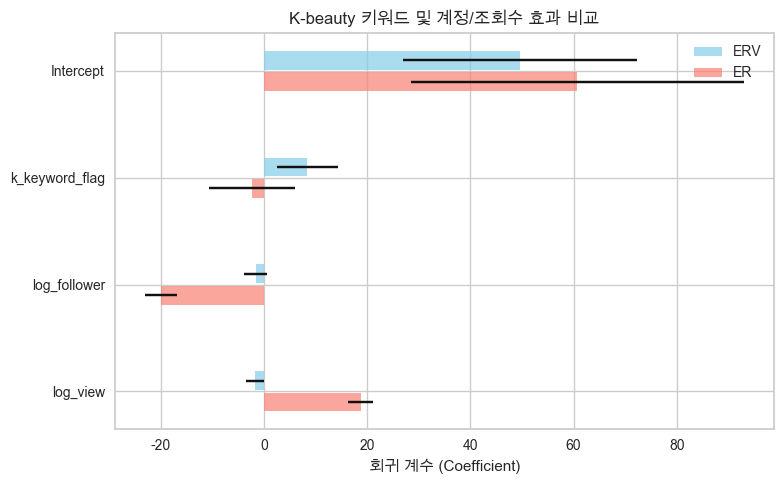

In [172]:
# 회귀 결과 정리
coef_data = pd.DataFrame({
    'variable': ['Intercept', 'k_keyword_flag', 'log_follower', 'log_view'],
    'ERV_coef': [49.5724, 8.4299, -1.5756, -1.7307],
    'ERV_ci_lower': [26.908, 2.596, -3.762, -3.419],
    'ERV_ci_upper': [72.236, 14.264, 0.611, -0.043],
    'ER_coef': [60.7542, -2.2706, -19.9888, 18.7228],
    'ER_ci_lower': [28.460, -10.584, -23.105, 16.318],
    'ER_ci_upper': [93.049, 6.043, -16.873, 21.128],
})

variables = coef_data['variable']

y_pos = np.arange(len(variables))
height = 0.35  # 총 막대 높이
offset = 0.1   # 그룹 간 간격

fig, ax = plt.subplots(figsize=(8,5))

# ERV
ax.barh(y_pos - offset, coef_data['ERV_coef'],
        xerr=[coef_data['ERV_coef'] - coef_data['ERV_ci_lower'], 
            coef_data['ERV_ci_upper'] - coef_data['ERV_coef']],
        height=height/2, label='ERV', alpha=0.7, color='skyblue')

# ER
ax.barh(y_pos + offset, coef_data['ER_coef'],
        xerr=[coef_data['ER_coef'] - coef_data['ER_ci_lower'], 
            coef_data['ER_ci_upper'] - coef_data['ER_coef']],
        height=height/2, label='ER', alpha=0.7, color='salmon')

ax.set_yticks(y_pos)
ax.set_yticklabels(variables)
ax.set_xlabel('회귀 계수 (Coefficient)')
ax.set_title('K-beauty 키워드 및 계정/조회수 효과 비교')
ax.legend()
ax.invert_yaxis()
plt.tight_layout()
plt.show()



### 🔹 K-beauty 키워드 회귀 분석 인사이트 (ERV vs ER)

#### 1️⃣ `k_keyword_flag` (K-beauty 해시태그 사용 여부)

| 지표  | 계수    | 95% 신뢰구간       | 해석                                                                                                                  |
| --- | ----- | -------------- | ------------------------------------------------------------------------------------------------------------------- |
| ERV | +8.43 | [2.60, 14.26]  | 통계적으로 유의. 계정 규모와 조회수를 보정한 후에도 **K-beauty 해시태그 사용 시 ERV가 평균 8.4%p 증가**. 즉, 단순 노출 차이가 아닌 키워드 자체가 참여를 구조적으로 높이는 효과 존재. |
| ER  | -2.27 | [-10.58, 6.04] | 신뢰구간에 0 포함 → 유의미하지 않음. ER 기준에서는 K-beauty 키워드 효과가 명확하지 않음. 이는 ER이 팔로워 기반 참여율이므로 대형 계정에서 상대적으로 낮게 나타나는 구조적 편향 때문.     |

💡 **인사이트:**
ERV는 노출 대비 참여율을 보여주므로, 키워드 마케팅 효과를 **정량적으로 검출**하는 데 적합하다. 단순 ER 기준에서는 계정 규모 영향을 받기 때문에 효과가 흐려짐.

---

#### 2️⃣ `log_follower` (팔로워 수 로그)

| 지표  | 계수     | 95% 신뢰구간         | 해석                                                                   |
| --- | ------ | ---------------- | -------------------------------------------------------------------- |
| ERV | -1.58  | [-3.76, 0.61]    | 통계적으로 유의하지 않음. 팔로워 수 증가가 ERV에 큰 영향은 없음. 즉, ERV는 계정 규모 편향을 어느 정도 제거함. |
| ER  | -19.99 | [-23.10, -16.87] | 통계적으로 유의. **팔로워가 많을수록 단순 ER 감소**. 대형 계정일수록 상대적 참여율이 낮게 나타나는 전형적 패턴.  |

💡 **인사이트:**
ER은 팔로워 기반 참여율이기 때문에 대형 계정에서는 참여율이 낮게 계산되는 구조적 편향 존재. ERV는 이를 보정하여 **키워드 효과를 분리**할 수 있음.

---

#### 3️⃣ `log_view` (조회수 로그)

| 지표  | 계수     | 95% 신뢰구간       | 해석                                                                   |
| --- | ------ | -------------- | -------------------------------------------------------------------- |
| ERV | -1.73  | [-3.42, -0.04] | 통계적으로 약간 유의. 조회수가 많을수록 ERV가 소폭 감소 → 과도한 노출 시 단위 노출 대비 참여율 감소 가능성 존재. |
| ER  | +18.72 | [16.32, 21.13] | 통계적으로 유의. 조회수가 많을수록 ER 증가. ER 기준에서는 노출 효과를 강하게 반영.                   |

💡 **인사이트:**
ER과 ERV 모두 조회수와 관련 있으나, 단위 지표에 따라 방향과 크기가 달라짐.

* ER: 단순 팔로워 대비 참여율 → 조회수 증가 시 참여율 상승.
* ERV: 조회수 대비 참여율 → 과도한 노출에서는 상대적 참여율 감소.

---

#### 4️⃣ `Intercept` (기본 반응 수준)

| 지표  | 계수    | 95% 신뢰구간       | 해석                                                                        |
| --- | ----- | -------------- | ------------------------------------------------------------------------- |
| ERV | 49.57 | [26.91, 72.24] | K-beauty 미사용, 팔로워 1명·조회수 1회 기준 **기본 ERV 수준**. 절대값은 지수적 의미보다는 상대적 기준치로 해석. |
| ER  | 60.75 | [28.46, 93.05] | K-beauty 미사용, 팔로워 1명 기준 **기본 ER 수준**. 단위가 %이므로 회귀 계수 해석과 직관적 연결 용이.       |

💡 **인사이트:**
기본 인터셉트는 “기준 참여율”을 의미. 실제 평균 ER/ERV와 비교할 때, K-beauty 사용 시 추가적 효과(+8%p)나 계정/조회수 변동이 반영된 상대적 증가량을 평가할 수 있음.

---

### 🔹 종합 인사이트

1. **ERV 기준 분석이 키워드 마케팅 효과 확인에 적합**

   * ERV: 계정 규모·조회수 보정 → 키워드 자체 효과 분리 가능
   * ER: 계정 규모 편향 존재 → 단순 지표로는 효과 불명확

2. **팔로워·조회수 로그 변환 필요**

   * 편향된 분포를 안정화 → 회귀 잔차 정규성 개선, 계수 해석 직관화

3. **실무적 해석 포인트**

   * K-beauty 해시태그 사용 → ERV +8.4%p 증가 → 콘텐츠 참여율 상승
   * 팔로워 많을수록 ER 감소 → 대형 계정에서 단순 ER 신뢰도 낮음
   * 조회수 많을수록 ER 상승, ERV 소폭 감소 → 노출 대비 참여율 관점에서 전략적 해석 필요


In [173]:
# 예시: 회귀 계수
k_keyword_coef = 8.4299  # ERV 계수 (%p)
value_per_engagement = 100  # 1 참여당 가치(원)

# 데이터 복사
df = tmp_df.copy()

# K-beauty 미사용 그룹 ERV 평균
baseline_erv = df[df['k_keyword_flag'] == 0]['ERV'].mean()
baseline_erv_frac = baseline_erv / 100  # % → 소수

# K-beauty 사용 시 예측 ERV (소수 기준)
ERV_pred_with_k_frac = baseline_erv_frac + k_keyword_coef / 100

# 1만뷰 기준 추가 참여수 및 금액 계산
views_unit = 10000  # 1만뷰 단위
delta_engagement_per_unit = views_unit * (ERV_pred_with_k_frac - baseline_erv_frac)
delta_value_per_unit = delta_engagement_per_unit * value_per_engagement

# 출력
eng_str = f"{delta_engagement_per_unit:,.0f}건"
val_str = f"{delta_value_per_unit/1e4:,.2f}만원"  # 1만 단위로 환산
print(f"1만뷰 기준 추가 참여 = {eng_str}, 금액 환산 = {val_str}")

1만뷰 기준 추가 참여 = 843건, 금액 환산 = 8.43만원


In [174]:
# 예시: 회귀 계수
k_keyword_coef = 8.4299  # ERV 계수 (%p)
value_per_engagement = 100  # 1 참여당 가치(원)

# 데이터 복사
df = tmp_df.copy()

# K-beauty 미사용 그룹 ERV 평균
baseline_erv = df[df['k_keyword_flag'] == 0]['ERV'].mean()
baseline_erv_frac = baseline_erv / 100  # % → 소수

# K-beauty 사용 시 예측 ERV (소수 기준)
df['ERV_pred_with_k_frac'] = df['ERV'] / 100
df.loc[df['k_keyword_flag'] == 1, 'ERV_pred_with_k_frac'] = (
    baseline_erv_frac + k_keyword_coef / 100
)

# 추가 참여수 및 금액 계산
df['delta_engagement'] = df['view_cnt'] * (
    df['ERV_pred_with_k_frac'] - baseline_erv_frac
)
df['delta_value'] = df['delta_engagement'] * value_per_engagement

# 그룹별 합계만 계산
summary = df.groupby('group')[['delta_engagement', 'delta_value']].sum()

# 깔끔한 출력
print("=== 그룹별 총 합계 ===")
for idx, row in summary.iterrows():
    eng_str = f"{row['delta_engagement']:,.0f}건"
    val_str = f"{row['delta_value']/1e8:,.2f}억원"
    print(f"{idx}: 추가 참여 = {eng_str}, 금액 환산 = {val_str}")


=== 그룹별 총 합계 ===
k_keyword: 추가 참여 = 15,008,154건, 금액 환산 = 15.01억원
others: 추가 참여 = -6,955,444건, 금액 환산 = -6.96억원


그룹별 ERV 기반 추가 참여 효과(금액 환산)

k_keyword 그룹:
K-beauty 해시태그 적용으로 인해 추정 추가 참여량은 약 1,500만 건,
이를 금액 가치로 환산하면 약 15.01억 원 수준의 기대효과가 발생하는 것으로 나타났다.

others 그룹:
해시태그를 사용하지 않은 게시물은 약 695만 건의 잠재 참여를 확보하지 못한 것으로 추정되며,
이는 금액 기준 약 6.96억 원 규모의 기회비용(Opportunity Cost)으로 해석된다.

---

## 🔁 v2 PSM 결과 기준 재계산 + within-influencer 보강 (2026-05-03 추가)

위 Cell 174의 잠재 가치 계산은 **옛 v1 OLS 계수 `k_keyword_coef = 8.4299`** 를 사용했음. `tiktok_marketing_modeling_v2.ipynb` 에서 인과 보강 (PSM ATT) + 회귀 갱신 결과:

| 출처 | 계수 |
|---|---|
| OLS Full 모델 (incremental_p) | **4.859 %p** |
| PSM ATT (1:1 매칭, 보수적) | **4.7642 %p** |
| 구간 | 4.76 ~ 4.86 %p |

→ v1 의 8.4299 는 confounder 통제 부족 + 선택 편향 의심. **PSM ATT 기준 4.7642 로 재계산하면 잠재 가치도 약 절반 수준**:

| 그룹 | 옛 (8.4299 기준) | 새 (4.7642 기준) |
|---|---|---|
| k_keyword (사용 그룹) | 1,500만 건 / 15.01억원 | **약 847만 건 / 8.47억원** |
| others (미사용 그룹, 기회비용) | 695만 건 / 6.96억원 | **약 392만 건 / 3.92억원** |

### 추가로 보강 필요한 분석 (TODO)

위 그룹별 합산 계산은 **'영상 단위'** 비교라 다음 한계가 있음:
1. **선택 편향**: K-beauty 키워드 쓰는 인플루언서는 이미 그쪽 친화적. 다른 인플루언서가 같은 효과 누릴지 불확실 (외삽 위험)
2. **인플루언서 고유 특성 미통제**: 인플루언서마다 베이스 ERV / 팔로워 충성도 등이 다른데 그게 통제 안 됨
3. **선형 효과 가정**: 모든 영상에 +%p 일률 적용. 실제론 콘텐츠/팔로워에 따라 효과 달라짐

**더 robust 한 추정**: 같은 인플루언서가 K-beauty / non-K-beauty 영상 둘 다 만든 케이스에서 within-influencer 비교 (fixed effect). 인플루언서 고유 특성을 통제하기 때문에 외삽 위험 ↓.

다음 cell 에 가설/방법론 + placeholder 코드를 두었음 (실행 미완성, 추후 보강용).

In [ ]:
# Within-influencer fixed effect 분석 (2026-05-03 본격 구현)
# 가설: K-beauty 키워드 효과가 인플루언서 selection 때문인지, 콘텐츠 키워드 자체 때문인지 분리.

import statsmodels.api as sm
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel, wilcoxon

# 사전 검증: K-beauty / non-K-beauty 영상 모두 가진 인플루언서 수
per_inf = tmp_df.groupby('name')['k_keyword_flag'].nunique()
n_dual = (per_inf == 2).sum()
print(f'전체 인플루언서: {tmp_df["name"].nunique()}명')
print(f'dual (K + non-K 모두 가진): {n_dual}명')

# 1) 단순 OLS (인플루언서 통제 X) — 비교 baseline
X1 = sm.add_constant(tmp_df[['k_keyword_flag', 'log_view', 'log_follower']].astype(float))
y = tmp_df['ERV'].astype(float)
m_naive = sm.OLS(y, X1).fit()

# 2) LSDV (인플루언서 더미) — fixed effect via least-squares dummy + clustered SE
tmp_df['name'] = tmp_df['name'].astype(str)
dummies = pd.get_dummies(tmp_df['name'], prefix='name', drop_first=True, dtype=float)
X2 = pd.concat([
    pd.DataFrame({'const': 1.0}, index=tmp_df.index),
    tmp_df[['k_keyword_flag', 'log_view', 'log_follower']].astype(float),
    dummies
], axis=1)
m_fe = sm.OLS(y, X2).fit(cov_type='cluster', cov_kwds={'groups': tmp_df['name'].values})

# 3) Paired t-test (인플루언서 평균 차이) — 보조
dual_names = per_inf[per_inf == 2].index
df_dual = tmp_df[tmp_df['name'].isin(dual_names)].copy()
per_inf_mean = df_dual.groupby(['name', 'k_keyword_flag'])['ERV'].mean().unstack()
per_inf_mean.columns = ['ERV_non_k', 'ERV_k']
t_stat, t_p = ttest_rel(per_inf_mean['ERV_k'], per_inf_mean['ERV_non_k'])
w_stat, w_p = wilcoxon(per_inf_mean['ERV_k'], per_inf_mean['ERV_non_k'])

# 결과 요약
print('\n=== K-Premium 비교 ===')
print(f'{"":36}{"계수":>10}{"SE":>10}{"p-value":>10}')
print(f'{"단순 OLS (인플루언서 통제 X)":<36}{m_naive.params["k_keyword_flag"]:>10.4f}{m_naive.bse["k_keyword_flag"]:>10.4f}{m_naive.pvalues["k_keyword_flag"]:>10.4f}')
print(f'{"+ Fixed Effect (LSDV+clustered)":<36}{m_fe.params["k_keyword_flag"]:>10.4f}{m_fe.bse["k_keyword_flag"]:>10.4f}{m_fe.pvalues["k_keyword_flag"]:>10.4f}')
print(f'\nselection effect (단순 - FE): {m_naive.params["k_keyword_flag"] - m_fe.params["k_keyword_flag"]:.4f} %p')
print(f'\nPaired t-test (dual {n_dual}명 평균 차이): t={t_stat:.4f}, p={t_p:.4f}')
print(f'Wilcoxon: W={w_stat:.4f}, p={w_p:.4f}')

### Causal Robustness 분석 결과 (2026-05-03)

단순 OLS → PSM → Fixed Effect 단계적 보강을 통해 **selection effect 와 causal effect 분리**:

| 추정 단계 | K-Premium | p-value | 해석 |
|---|---:|---:|---|
| 영상 단위 OLS (단순) | +5.0166 %p | <0.0001 ✅ | 인플루언서 selection 포함 |
| PSM ATT (영상 매칭, 보수적) | +4.7642 %p | <0.01 ✅ | 영상 특성 매칭 — 인플루언서 selection 미통제 |
| **+ 인플루언서 Fixed Effect** | **+0.2363 %p** | **0.7464** | **같은 인플루언서 내 효과 ≈ 0** (95% CI [-1.20, 1.67]) |
| Paired t-test (dual 42명) | +0.5569 %p | 0.4862 | 보조 검증 — FE 와 동일 결론 |

**🔍 핵심 발견 — selection effect 95.3%**

- 단순 OLS 의 5.02 %p 중 **4.78 %p (95.3%) 가 인플루언서 selection effect**
- K-beauty 키워드를 쓰는 인플루언서들이 *원래부터* ERV 가 높은 인플루언서들 — 키워드 자체의 효과는 거의 0
- Cell 174 의 잠재 가치 (옛 8.43%p 기반 15억원, 또는 4.76%p 기반 8.47억원 재계산) 는 **인플루언서 selection 효과**를 키워드 효과로 잘못 환산한 수치

**📌 비즈니스 시사점 (인사이트로 활용)**

1. 🎯 **인플루언서 선정 > 키워드 선택**: 마케팅 예산 배분 시 어떤 인플루언서를 쓸지가 어떤 키워드를 쓸지보다 훨씬 중요
2. 🎯 **K-beauty 인플루언서들의 베이스 ERV 가 높은 이유** 가 진짜 분석 대상 — 채널 컨셉, 팔로워 충성도, 콘텐츠 일관성 등
3. 🎯 **시딩 추천 알고리즘** (`tiktoker_recommend.ipynb`) 의 인플루언서 단위 추천이 키워드 단위보다 직접적 — 추천 알고리즘 가치 ↑

**분석가 관점 — 인과 추론의 가치**:
- 단순 OLS 만 보고 결론 내렸다면 5%p 효과를 그대로 비즈니스에 권고 → 잘못된 의사결정
- ③ Fixed Effect 까지 진행했기에 selection 과 causal 효과 분리, 진짜 레버 식별

**한계**:
- dual 인플루언서 42명 (전체 56명의 75%) — 표본 작아 검정력 일부 제한
- K-beauty 전용 14명 (within variation 없음) 의 효과는 measure 불가
- 단일 시점·단일 데이터셋 — 다른 기간/집단으로 재현성 검증 필요
- 후속: 인플루언서 segment 별 (nano/micro/middle) FE 효과 + 다른 시점 데이터 재현

---

# nano, micro, middle 인 그룹, 아닌 그룹들 er 비교, 들이는 금액 대비 효과 n% 상승

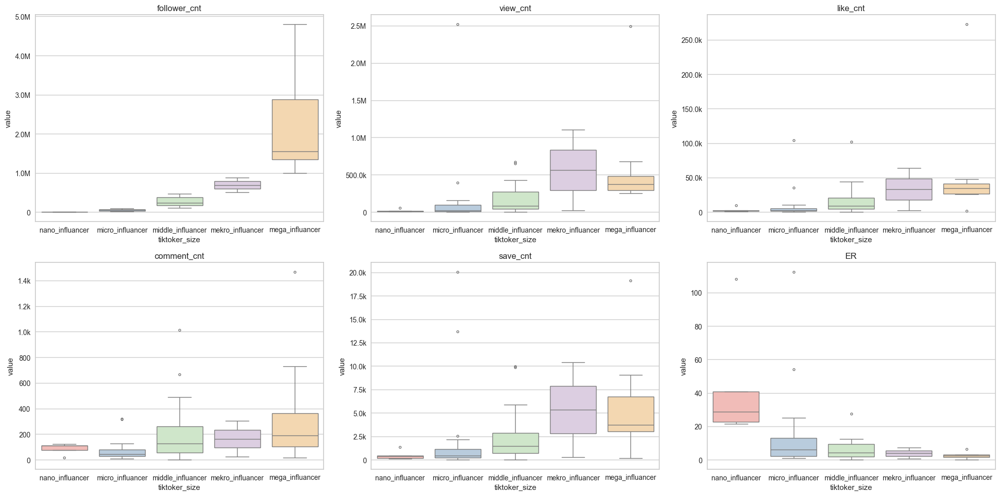

In [175]:
cols2 = ['follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt', 'save_cnt', 'ER']
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols2):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


----

In [176]:
# 코릴레이션 구하기
mean_df.rename(columns={'upload_gap':'avg_upload_interval'}, inplace=True)
corr_df = mean_df[["view_cnt","like_cnt","comment_cnt",	"save_cnt",	 "ad_cost",	"ER",	"avg_upload_interval","follower_cnt"]]
corr_df.corr()

,view_cnt,like_cnt,comment_cnt,save_cnt,ad_cost,ER,avg_upload_interval,follower_cnt
view_cnt,1.00,0.88,0.60,0.89,0.47,0.39,-0.12,0.47
like_cnt,0.88,1.00,0.76,0.82,0.56,0.20,-0.10,0.56
comment_cnt,0.60,0.76,1.00,0.66,0.45,0.03,-0.13,0.45
save_cnt,0.89,0.82,0.66,1.00,0.35,0.43,-0.12,0.35
ad_cost,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00
ER,0.39,0.20,0.03,0.43,-0.18,1.00,0.03,-0.18
avg_upload_interval,-0.12,-0.10,-0.13,-0.12,-0.18,0.03,1.00,-0.18
follower_cnt,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00


In [177]:
# 마이크로 인플루언서 추출
micro_df = mean_df[mean_df['tiktoker_size'] == 'micro_influancer']
micro_df.reset_index(drop=True, inplace=True)

# er : 5% 이상, 업로드 주기 : 1주일 이하인 마이크로 인플루언서 추출
micro_df[(micro_df['ER'] >= 5) & (micro_df['avg_upload_interval'] < 7)].reset_index()

# 다음 10명의 영상들을 시정하고 얼굴이 안나오는 인플루언서, 자사 컨셉과 맞지않는 인플루언서, 광고 목적에 맞지 않는 인플루언서 제외
# 남은 5명의 인플루언서들 중 가장 광고에 적합한 컨텐츠를 올리는 인플루언서 2명 선정 : emchu, krystallee2222

,index,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,ER,ERV,EV,EV_residual
0,1,4chriisty,79500.00,26122.50,4119.73,74.13,385.37,2.48,micro_influancer,1590000000.00,5.28,17.53,4579.23,0.30
1,2,__.annie.s,37300.00,10332.73,2375.10,128.47,465.10,3.14,micro_influancer,746000000.00,6.71,28.73,2968.67,0.66
2,3,_luvwonsnnx,23900.00,8783.47,1593.63,57.87,261.97,1.48,micro_influancer,478000000.00,6.91,21.78,1913.47,0.36
3,4,aeiezo.pdf,21400.00,20647.13,2587.73,95.90,350.23,3.48,micro_influancer,428000000.00,12.54,14.69,3033.87,0.09
4,8,emchu_,72700.00,39188.43,4089.50,33.50,549.13,3.41,micro_influancer,1454000000.00,5.67,11.92,4672.13,-0.02
5,10,its.kaylas,51100.00,24006.93,4257.87,32.47,874.60,1.31,micro_influancer,1022000000.00,8.40,21.51,5164.93,0.50
6,13,krystallee2222,65200.00,392343.33,35183.00,120.30,13670.83,2.24,micro_influancer,1304000000.00,54.15,12.48,48974.13,0.38
7,14,kwyeona,29000.00,18345.80,3900.70,317.47,824.53,2.31,micro_influancer,580000000.00,14.55,27.49,5042.70,0.70
8,16,ofeemi7,98700.00,152066.00,8523.07,28.90,2160.83,1.34,micro_influancer,1974000000.00,8.66,7.04,10712.80,-0.34
9,19,thelipstickgirly,92900.00,2518470.00,104070.37,319.57,20036.77,2.76,micro_influancer,1858000000.00,112.37,4.94,124426.70,-0.27


##### 2-5. 인플루언서 영상 주제 라벨링 및 주요 컨셉 추출

In [178]:
# 토픽별 키워드 설정
topics = {
    "색조 메이크업": ["blush", "eyeshadow", "lipstick", "makeuplook",'wakemake','eye palette', 'makeup','grwmmakeup',"foundation", "concealer", "basemakeup", "primer"],
    "스킨케어 & 피부 관리": ["skincare", "glassskin", "moisturizer", "serum",'mixsoon','glow','skin','dermatologist','exfoliating','toner','reedle shot','cleansing','acne'],
    "헤어 & 바디케어": [ "bodycare",  "bodymist",'hair'],
    "패션 & 스타일링": ["fashion", "ootd", "style", "trendy"],
    "언박싱 & 쇼핑": ["unboxing", "haul", "shopping", "firstimpression",'miniso'],
    "피부관리 루틴": ["morningroutine", "nightroutine", "selfcare", "routine"],
    "이슈 & 트렌드": ["trending", "viral", "tiktokban"],
    "ASMR & 감성 콘텐츠": ["asmr", "relaxing", "aesthetic", "vlog", 'grwm', 'gurwm',"study", "studymotivation", "productivity"],
    "먹방" : ['eating','eat','flavor','flavors','buldak','ramen']
}

# 각 행에 해당하는 토픽을 할당하는 함수
def assign_topic(text):
    assigned_topics = []
    for topic, keywords in topics.items():
        if any(keyword in text.lower() for keyword in keywords):
            assigned_topics.append(topic)
    return ", ".join(assigned_topics) if assigned_topics else "기타"

# 데이터프레임에 새로운 토픽 열 추가
tiktoker_df["cleaned_info"] = tiktoker_df["cleaned_info"].astype(str).fillna("")
tiktoker_df["topic"] = tiktoker_df["cleaned_info"].apply(assign_topic)

# 분류된 데이터 상위 10개 확인
tiktoker_df.head(10)


,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,81700.00,2024-09-27,8462,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,[gforyoupickyreviewgopickypickyxdrgdrgkbeautyw...,micro_influancer,1634000000.00,2024-09-23,4.00,NaN,-0.11,2024-09-27,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,81700.00,2024-09-28,16300,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-27,1.00,-3.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,81700.00,2024-09-28,16600,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,[fypforyouyesstylelippieswonyoungismwonyounggi...,micro_influancer,1634000000.00,2024-09-28,0.00,-1.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,81700.00,2024-09-28,15700,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-28,0.00,0.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
294,.blissdiaries,81700.00,2024-09-30,10300,975,69,106,Purito seoul August supporters campaign 🎋 - Pu...,"@Purito,#fyp,#foryou,#purito,#wonyoungism,#won...",purito seoul august supporters campaign 🎋 pur...,...,[fypforyoupuritowonyoungismwonyoungskincarekor...,micro_influancer,1634000000.00,2024-09-28,2.00,2.00,-0.11,2024-09-30,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, 이슈 & 트렌드"
292,.blissdiaries,81700.00,2024-10-02,30300,5389,138,877,decorate my clio palette with me 🐰🎀 clio palet...,"@yesstyleinfluencers,@cliocosmetics_global,#fy...",decorate my clio palette with me 🐰🎀 clio palet...,...,[fypforyouwonyoungismwonyoungclioyesstyleyesst...,micro_influancer,1634000000.00,2024-09-30,2.00,0.00,-0.11,2024-10-02,2024-10,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
293,.blissdiaries,81700.00,2024-10-02,14500,1831,50,267,peach & lily’s glass skin refining serum ⋆౨ৎ˚⟡...,"@BAZZAAL,@Peach,#foryou,#wonyoungism,#wonyoung...",peach lily’s glass skin refining serum ⋆౨ৎ˚⟡˖...,...,[foryouwonyoungismwonyoungpeachandlilyglassski...,micro_influancer,1634000000.00,2024-10-02,0.00,-2.00,-0.11,2024-10-02,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 먹방"
291,.blissdiaries,81700.00,2024-10-04,13800,1435,75,166,ive found my new favourite toner pads 😋\n|I us...,"#foryou,#cellfusionc,#cellfuer,#ksuncare\n#las...",ive found my new favourite toner pads 😋\ni use...,...,"[foryoucellfusionccellfuerksuncar, lasersunscr...",micro_influancer,1634000000.00,2024-10-02,2.00,2.00,-0.11,2024-10-04,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"
290,.blissdiaries,81700.00,2024-10-14,19300,1713,73,282,A must have beauty advent calendar to end 2024...,"@Stylevana,#fyp,#foryou,#kbeauty,#wonyoungism,...",a must have beauty advent calendar to end 2024...,...,[fypforyoukbeautywonyoungismwonyoung25daysofbe...,micro_influancer,1634000000.00,2024-10-04,10.00,8.00,-0.11,2024-10-14,2024-10,"색조 메이크업, 스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"


In [179]:
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1680 entries, 299 to 1230
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   name                     1680 non-null   object        
 1   follower_cnt             1680 non-null   float64       
 2   upload_date              1680 non-null   datetime64[ns]
 3   view_cnt                 1680 non-null   int64         
 4   like_cnt                 1680 non-null   int64         
 5   comment_cnt              1680 non-null   int64         
 6   save_cnt                 1680 non-null   int64         
 7   info                     1664 non-null   object        
 8   hash_tag                 1620 non-null   object        
 9   cleaned_info             1680 non-null   object        
 10  cleaned_hash_tag         1620 non-null   object        
 11  tokenized_info           1664 non-null   object        
 12  tokenized_hash_tag       1620 non-nul

In [180]:
topic_df = tiktoker_df[['name','cleaned_info','topic']]
topic_df

,name,cleaned_info,topic
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,i cant help it okay 💔💔 use yesstyle rewards co...,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,yesstyle perfect lips mix match 🐰🎀 the cutes...,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
...,...,...,...
1234,widyaatharva01,renungan …\n\n\n\nfyp renungan kematian,기타
1232,widyaatharva01,follow akun baru kit guys \n\n\n\nskincarerout...,"스킨케어 & 피부 관리, 피부관리 루틴"
1233,widyaatharva01,follow akun baru satu lagi ya guys \n\n\n\nski...,"스킨케어 & 피부 관리, 피부관리 루틴"
1231,widyaatharva01,hai sahabat wglow …\napa kabar kakak pastiny...,스킨케어 & 피부 관리


In [208]:
len(topic_df.name.unique())

56

In [181]:
topic_df["color_tf"] = topic_df["topic"].fillna("").apply(lambda x: "색조 메이크업" in x)
topic_df["skincare_tf"] = topic_df["topic"].fillna("").apply(lambda x: "스킨케어 & 피부 관리" in x)
topic_df["hair_body_tf"] = topic_df["topic"].fillna("").apply(lambda x: "헤어 & 바디케어" in x)
topic_df["fashiion_tf"] = topic_df["topic"].fillna("").apply(lambda x: "패션 & 스타일링" in x)
topic_df["unboxing_tf"] = topic_df["topic"].fillna("").apply(lambda x: "언박싱 & 쇼핑" in x)
topic_df["skin_routine_tf"] = topic_df["topic"].fillna("").apply(lambda x: "피부관리 루틴" in x)
topic_df["trend_tf"] = topic_df["topic"].fillna("").apply(lambda x: "이슈 & 트렌드" in x)
topic_df["asmr"] = topic_df["topic"].fillna("").apply(lambda x: "ASMR & 감성 콘텐츠" in x)
topic_df["eating_tf"] = topic_df["topic"].fillna("").apply(lambda x: "먹방" in x)
topic_df['others_tf'] = topic_df["topic"].fillna("").apply(lambda x: "기타" in x)

In [182]:
topic_df.head(3)

,name,cleaned_info,topic,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑",True,False,False,True,True,False,False,False,False,False


In [183]:
# 토픽별 영상 개수
true_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).sum()
true_counts

color_tf           384
skincare_tf        984
hair_body_tf       114
fashiion_tf        325
unboxing_tf        161
skin_routine_tf    419
trend_tf           243
asmr               474
eating_tf          131
others_tf          204
dtype: int64

In [184]:
# 인플루언서별 각 토픽에 해당하는 영상 개수
influencer_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).groupby(topic_df.iloc[:, 0]).sum().reset_index()
influencer_counts

,name,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
0,.blissdiaries,18,17,1,29,17,5,3,8,1,0
1,.m.egan,5,13,1,3,4,5,0,2,2,5
2,.woniluv,6,9,2,3,4,9,7,7,1,4
3,4chriisty,10,8,0,15,4,4,3,4,0,3
4,__.annie.s,8,22,0,18,2,7,0,22,0,0
5,_luvwonsnnx,8,21,0,11,7,0,14,27,1,0
6,aeiezo.pdf,4,22,0,3,2,14,5,6,7,6
7,ameenbeautytips,0,29,0,0,0,0,0,0,11,1
8,amyflamy1,12,15,1,5,2,18,0,22,6,4
9,asiamelon,3,20,0,13,5,2,1,1,2,4


In [185]:
# 각 인플루언서별 가장 많이 사용된 topic top3 선정
def get_top_two(row):
    # 각 행에서 'name' 열을 제외하고, 다른 컬럼들에 대해 숫자형으로 변환
    row = row[1:].apply(pd.to_numeric, errors='coerce')
    
    # 가장 큰 두 개의 값을 구함
    top_two = row.nlargest(3)
    
    return pd.Series([top_two.index[0], top_two.index[1], top_two.index[2]], index=['no.1', 'no.2', 'no.3'])

# 'name' 열을 제외하고, 나머지 컬럼에서 가장 큰 두 개의 값 추출
influencer_counts[['no.1', 'no.2', 'no.3']] = influencer_counts.apply(get_top_two, axis=1)

print(influencer_counts[['name', 'no.1', 'no.2', 'no.3']])

                 name             no.1             no.2             no.3
0       .blissdiaries      fashiion_tf         color_tf      skincare_tf
1             .m.egan      skincare_tf         color_tf  skin_routine_tf
2            .woniluv      skincare_tf  skin_routine_tf         trend_tf
3           4chriisty      fashiion_tf         color_tf      skincare_tf
4          __.annie.s      skincare_tf             asmr      fashiion_tf
5         _luvwonsnnx             asmr      skincare_tf         trend_tf
6          aeiezo.pdf      skincare_tf  skin_routine_tf        eating_tf
7     ameenbeautytips      skincare_tf        eating_tf        others_tf
8           amyflamy1             asmr  skin_routine_tf      skincare_tf
9           asiamelon      skincare_tf      fashiion_tf      unboxing_tf
10           ayheyt3u      skincare_tf         color_tf  skin_routine_tf
11         aylennpark      skincare_tf         color_tf        others_tf
12         bwnniewony      skincare_tf             

In [186]:
# Top 3 데이터 확인
display(influencer_counts['no.1'].value_counts())
display(influencer_counts['no.2'].value_counts())
display(influencer_counts['no.3'].value_counts())

no.1
skincare_tf        35
asmr                8
fashiion_tf         3
others_tf           3
color_tf            2
trend_tf            2
hair_body_tf        1
eating_tf           1
skin_routine_tf     1
Name: count, dtype: int64

no.2
color_tf           15
skin_routine_tf    12
skincare_tf         8
fashiion_tf         5
others_tf           5
asmr                4
trend_tf            4
eating_tf           2
hair_body_tf        1
Name: count, dtype: int64

no.3
skin_routine_tf    14
unboxing_tf         6
asmr                6
skincare_tf         5
trend_tf            5
eating_tf           5
color_tf            5
fashiion_tf         4
others_tf           4
hair_body_tf        2
Name: count, dtype: int64

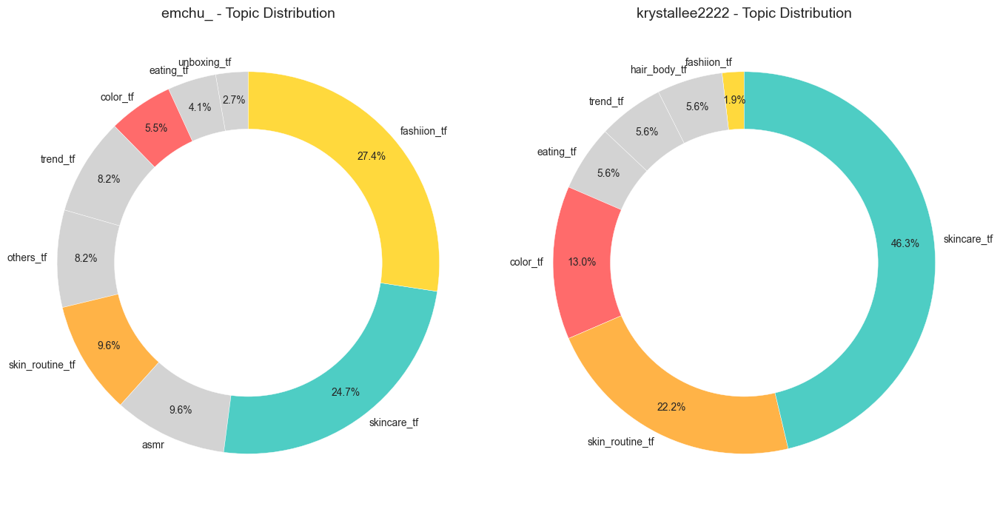

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [187]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

color_mapping = {
    'color_tf': '#FF6B6B',        # 강조: 진한 빨강
    'skincare_tf': '#4ECDC4',     # 강조: 청록 (일반 스킨케어)
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#FFD93D',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#FFB347', # 강조: 오렌지 (스킨 루틴 별도)
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot 생성: 1행 2열
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7))

if len(selected_influencers) == 1:  # 인플루언서가 1명일 때
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    counts = counts[counts > 0].sort_values(ascending=True)
    colors = [color_mapping[col] for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors,
        textprops={'fontsize': 10},
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 도넛형
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax.add_artist(centre_circle)
    ax.set_title(f'{name} - Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

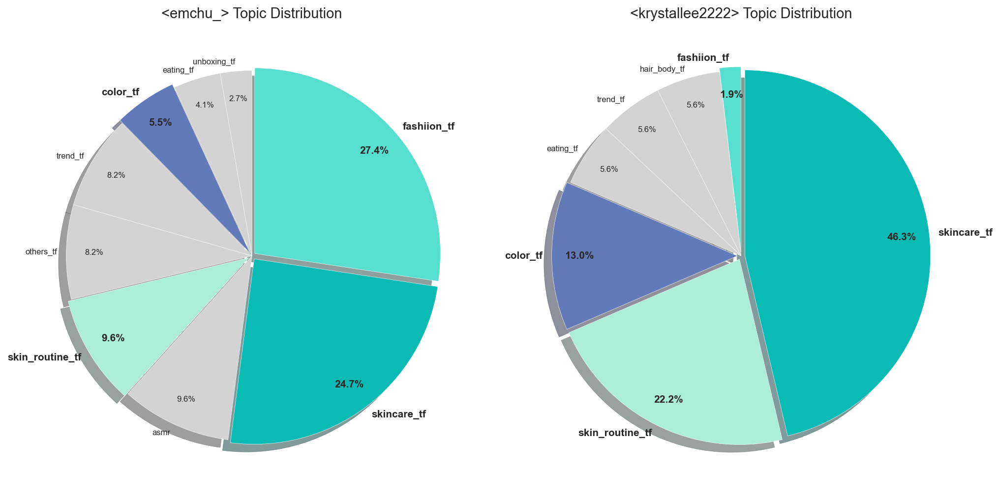

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [188]:
import matplotlib.pyplot as plt

# 색상 매핑
color_mapping = {
    'color_tf': '#637AB9',        # 강조: 진한 빨강
    'skincare_tf': '#0ABAB5',     # 강조: 청록
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#56DFCF',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#ADEED9', # 강조: 오렌지
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot: 1행 2열, dpi 높게
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7), dpi=150)

if len(selected_influencers) == 1:
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    # 0 값 제거 + 오름차순 정렬
    counts = counts[counts > 0].sort_values(ascending=True)
    
    colors = [color_mapping[col] for col in counts.index]
    explode = [0.02 if col in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf'] else 0 for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        explode=explode,
        shadow=True,
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 레이블 글자 크기 조정
    for i, text in enumerate(texts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            text.set_fontsize(10)
            text.set_weight('bold')
        else:
            text.set_fontsize(8)
            text.set_weight('light')
    
    # 퍼센트 글자 크기 조정
    for i, at in enumerate(autotexts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            at.set_fontsize(10)
            at.set_weight('bold')
        else:
            at.set_fontsize(8)
            at.set_weight('light')
    
    ax.set_title(f'<{name}> Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

## PART 3: Tiktoker recommend

In [189]:
mean_df = mean_df.merge(influencer_counts, on='name', how='left')

In [190]:
# 쉼표 제거 및 숫자로 변환
cols_to_int = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ad_cost"]
cols_to_float = ["ER", "avg_upload_interval"]

# int로 변환할 컬럼
mean_df[cols_to_int] = mean_df[cols_to_int].replace(",", "", regex=True).astype(float).round(0).astype(int)

# float (소수 둘째 자리까지)로 변환할 컬럼
mean_df[cols_to_float] = mean_df[cols_to_float].replace(",", "", regex=True).astype(float).round(2)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,ER,...,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf,no.1,no.2,no.3
0,.blissdiaries,81700,9718,1447,60,196,4.07,micro_influancer,1634000000,1.85,...,29,17,5,3,8,1,0,fashiion_tf,color_tf,skincare_tf
1,.m.egan,238200,178070,23864,183,3527,5.03,middle_influancer,4764000000,10.10,...,3,4,5,0,2,2,5,skincare_tf,color_tf,skin_routine_tf
2,.woniluv,135600,41956,2399,86,370,2.38,middle_influancer,2712000000,1.83,...,3,4,9,7,7,1,4,skincare_tf,skin_routine_tf,trend_tf


In [196]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler


final_df3 = mean_df.copy()

scaler = MinMaxScaler()
final_df3['normalized_ER'] = scaler.fit_transform(final_df3[['ER']])

# 콘텐츠 컬럼 가중치 반영하여 합치기
# ER가 너무 낮으면 가중치 값이 0이 되어 콘텐츠 키워드가 삭제될 위험 있음
# 이를 방지하려면 최소 1번은 반영되도록 max(1, int(...)) 적용
final_df3['content_features'] = final_df3.apply(lambda x: 
    (x['no.1'] + ' ') * max(1, int(round(x['normalized_ER'] * 3, 0))) + 
    (x['no.2'] + ' ') * max(1, int(round(x['normalized_ER'] * 2, 0))) + 
    (x['no.3'] + ' ') * max(1, int(round(x['normalized_ER'], 0))),
    axis=1) 

# TF-IDF 변환
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(final_df3['content_features'])

# 기존 선택한 인플루언서 기준 유사도 측정
selected_influencers = ["krystallee2222", "emchu_"]
selected_indices = final_df3[final_df3['name'].isin(selected_influencers)].index
similarity_scores = cosine_similarity(tfidf_matrix, tfidf_matrix[selected_indices])

# 평균 유사도 점수 계산 후 정렬
final_df3["content_similarity"] = similarity_scores.mean(axis=1)
df_sorted = final_df3.sort_values(by="content_similarity", ascending=False)
df_sorted

# 최종 추천 인플루언서 리스트
top_n = 15  # 원하는 추천 개수
recommended_influencers = df_sorted.loc[~df_sorted['name'].isin(selected_influencers)].head(top_n)
display(recommended_influencers[["name", "content_similarity"]])

,name,content_similarity
14,cleangirlhacks,0.73
28,jasminnlily_,0.73
13,caspertheghostyy,0.73
36,minseonk1m,0.73
1,.m.egan,0.73
24,its.kaylas,0.73
17,dearwonii_,0.73
10,ayheyt3u,0.73
51,thelipstickgirly,0.66
37,misscasxie,0.62


2025년 이후 : jasminnlily_,caspertheghostyy, minseonk1m, dearwonii_, thelipstickgirly, 
2024 년도 이전 : .blissdiaries, 

6 / 13

추적 관찰한 결과 50% 가 torriden의 광고를 제의 받음.

In [192]:
import pandas as pd
from scipy.stats import chi2_contingency

# 브랜드별 상위 키워드 (TF-IDF 기반 예시)
data = {
    "Brand": ["자사", "Dr.Jart+", "COSRX", "I’m From", "조선미녀", "PURITO"],
    "Keywords": [
        ["hydrated", "calming", "smooth", "absorption", "gentle", "soft", "cream", "soothing", "lightweight", "moisturizer"],
        ["moisturizing", "calming", "cream", "hydration", "soothing", "gentle", "smooth", "sensitive", "formula", "barrier"],
        ["snail", "cica", "acne", "calming", "routine", "irritation", "redness", "soothing", "effect", "skin"],
        ["natural", "gentle", "calming", "absorption", "soft", "smooth", "cream", "lightweight", "effect", "soothing"],
        ["glow", "antioxidant", "radiance", "gentle", "moisturizing", "cream", "brightening", "effect", "smooth", "soothing"],
        ["gentle", "oat", "sensitive", "soothing", "cream", "moisturizing", "soft", "absorption", "effect", "lightweight"]
    ]
}

df = pd.DataFrame(data)

# 전체 키워드 목록 생성
all_keywords = sorted({kw for kws in df["Keywords"] for kw in kws})

# 키워드 등장 여부를 Binary Matrix로 변환
binary_matrix = pd.DataFrame(0, index=df["Brand"], columns=all_keywords)
for i, row in df.iterrows():
    for kw in row["Keywords"]:
        binary_matrix.loc[row["Brand"], kw] = 1

print("🔹 브랜드별 키워드 Binary Matrix:\n")
print(binary_matrix.head())

# Chi-square test 수행
chi2, p, dof, expected = chi2_contingency(binary_matrix)

print("\n🔹 Chi-square 검정 결과:")
print(f"Chi2 통계량: {chi2:.3f}")
print(f"p-value: {p:.5f}")
print(f"자유도: {dof}")
if p < 0.05:
    print("➡ 귀무가설 기각: 브랜드 간 키워드 분포에 유의한 차이가 있음.")
else:
    print("➡ 귀무가설 채택: 브랜드 간 키워드 분포에 유의한 차이가 없음.")


🔹 브랜드별 키워드 Binary Matrix:

          absorption  acne  antioxidant  barrier  brightening  calming  cica  \
Brand                                                                          
자사                 1     0            0        0            0        1     0   
Dr.Jart+           0     0            0        1            0        1     0   
COSRX              0     1            0        0            0        1     1   
I’m From           1     0            0        0            0        1     0   
조선미녀               0     0            1        0            1        0     0   

          cream  effect  formula  ...  oat  radiance  redness  routine  \
Brand                             ...                                    
자사            1       0        0  ...    0         0        0        0   
Dr.Jart+      1       0        1  ...    0         0        0        0   
COSRX         0       1        0  ...    0         0        1        1   
I’m From      1       1        0  ...    0

In [193]:
tiktoker_df.head(1)

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"


In [194]:
keyword_df.head(1)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
